<a href="https://colab.research.google.com/github/poandpo/project-2/blob/main/project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 데이터 선정 이유 및 문제 정의

###pip 설치

In [ ]:
%%capture
import sys

if 'google.colab' in sys.modules:
    # Install packages in Colab
    !pip install category_encoders==2.*
    !pip install eli5
    !pip install pandas-profiling==2.*
    !pip install pdpbox
    !pip install shap
    !pip install catboost

In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.pipeline import make_pipeline
from catboost import CatBoostRegressor
from category_encoders import TargetEncoder
from sklearn.pipeline import Pipeline
from category_encoders import OrdinalEncoder

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### 데이터 불러오기

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving train.csv to train (1).csv


In [ ]:
import pandas as pd

train= pd.read_csv('train.csv')


## 데이터 살펴보기

In [ ]:
train

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,318434,6,a,6,X,3,radiotherapy,Q,F,4.0,86499,23.0,Emergency,Moderate,3,41-50,4144.0,11-20
318434,318435,24,a,1,X,2,anesthesia,Q,E,4.0,325,8.0,Urgent,Moderate,4,81-90,6699.0,31-40
318435,318436,7,a,4,X,3,gynecology,R,F,4.0,125235,10.0,Emergency,Minor,3,71-80,4235.0,11-20
318436,318437,11,b,2,Y,3,anesthesia,Q,D,3.0,91081,8.0,Trauma,Minor,5,11-20,3761.0,11-20


0. case_id:	Case_ID registered in Hospital
1.	Hospital_code:	Unique code for the Hospital
2.	Hospital_type_code:	Unique code for the type of Hospital
3.	City_Code_Hospital:	City Code of the Hospital
4.	Hospital_region_code:	Region Code of the Hospital
5.	Available Extra Rooms: in Hospital	Number of Extra rooms available in the Hospital
6.	Department:	사례를 감독하는 부서
7.	Ward_Type:	Code for the Ward(병동) type
8.	Ward_Facility_Code:	Code for the Ward Facility(병동 시설)
9.	Bed Grade:	병동의 침대 상태
10.	patientid:	고유한 환자 id
11.	City_Code_Patient:	City Code for the patient (환자 거주지로 추측)
12.	Type of Admission:	병원에서 등록한 입원 유형
13.	Severity of Illness	:당시 기록된 질병의 심각성.
14.	Visitors with Patient: 환자가 있는 방문자 수
15.	Age:	Age of the patient
16.	Admission_Deposit:	입원할 때 보증금
17.	Stay:	Stay Days by the patient

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 18 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

In [ ]:
train.T.duplicated(subset=None, keep='first')

case_id                              False
Hospital_code                        False
Hospital_type_code                   False
City_Code_Hospital                   False
Hospital_region_code                 False
Available Extra Rooms in Hospital    False
Department                           False
Ward_Type                            False
Ward_Facility_Code                   False
Bed Grade                            False
patientid                            False
City_Code_Patient                    False
Type of Admission                    False
Severity of Illness                  False
Visitors with Patient                False
Age                                  False
Admission_Deposit                    False
Stay                                 False
dtype: bool

In [ ]:
import pandas_profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(train, title="Pandas Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train['case_id' ].value_counts()

2047      1
107105    1
31322     1
29275     1
19036     1
         ..
21920     1
23969     1
17826     1
19875     1
2049      1
Name: case_id, Length: 318438, dtype: int64

In [ ]:
train['patientid'].value_counts()

In [ ]:
[(x, train[x].isnull().sum()) for x in train.columns if train[x].isnull().any()]

[('Bed Grade', 113), ('City_Code_Patient', 4532)]

In [ ]:
train['City_Code_Patient' ].value_counts()

8.0     124011
2.0      38869
1.0      26377
7.0      23807
5.0      20079
4.0      15380
9.0      11795
15.0      8950
10.0      8174
6.0       6005
12.0      5647
3.0       3772
23.0      3698
14.0      2927
16.0      2254
13.0      1625
21.0      1602
20.0      1409
18.0      1404
19.0      1028
26.0      1023
25.0       798
27.0       771
11.0       658
28.0       521
22.0       405
24.0       360
30.0       133
29.0        98
33.0        78
31.0        59
37.0        57
32.0        52
34.0        46
35.0        16
36.0        12
38.0         6
Name: City_Code_Patient, dtype: int64

In [ ]:
train.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


In [ ]:
train['Department'].value_counts()

gynecology            244717
anesthesia             29059
radiotherapy           27617
TB & Chest disease      9464
surgery                 1157
Name: Department, dtype: int64

In [ ]:
train['Type of Admission'].value_counts()

Trauma       148921
Emergency    115230
Urgent        47863
Name: Type of Admission, dtype: int64

In [ ]:
train['Severity of Illness'].value_counts()

Moderate    175843
Minor        85872
Extreme      56723
Name: Severity of Illness, dtype: int64

In [ ]:
train['Age'].value_counts()

41-50     63749
31-40     63639
51-60     48514
21-30     40843
71-80     35792
61-70     33687
11-20     16768
81-90      7890
0-10       6254
91-100     1302
Name: Age, dtype: int64

데이터을 선택한 이유
- 다중클래스 문제를 회귀로 접근해보고 싶어서
- 데이터의 크기가 충분하고 깔끔한 데이터
- 데이터는 환자의 입원 기간에 따른 의료관리 상황을 나타내주는데, 현재 코로나로 의료 관리에 대해 중요성이 높아진 만큼 어떤 의료 상황들이 환자의 입원 기간을 늘리는지가 궁금하여서 이 데이터를 선택하게 되었습니다.

- 회귀로 접근할 것이다.

## 데이터를 이용한 가설 및 평가지표, 베이스라인 선택

* 가설[성능]
  
0. 다중클래스 문제를 다중 회귀모델로 변환하여 학습할 수 있다
   - R2 score 가 0.5 이상이다
1. 모든 특성을 학습시킨 모델보다 순열중요도로 특성선택한 모델이 학습시켰을 때 성능이 좋다.
    - 1.  특성선택으로 학습시킨 모델보다 순열중요도로 특성선택한 모델이 성능이 좋다
2.   다른 모델들보다 그래디언트 부스팅 모델, 그 중 XGBoost으로 한 예측모델이 가장 성능이 좋다(그래디언트 모델끼리 성능비교)
    -  ordinal보다 Target 일때 학습시켰을 때 성능이 좋다 

* 평가지표: MAE, R-squared 사용
 > 직관적이고 이상치 영향을 덜 받는 MAE

 > scale에 영향을 받지 않고, 회귀모델의 설명력을 표현하기 위해 R-squared(결정계수)를 사용

* 베이스 라인은 회귀문제일때 주로 사용하는 타겟의 평균값으로 선택할 것입니다.
* target: stay (데이터 선택 이유에서 같이 설명)
> 입원기간이 의료 관리의 효율성을 개선하려는 경우 관찰하고 예측하는 중요한 매개변수 중 하나이기 때문에 입원기간을 타셋으로 잡고 예측함

## EDA와 데이터 전처리

In [ ]:
import random # 다중클래스를 회귀로 바꿈
random.seed(1)
def stay_cat_encoder(x):
    if x == '0-10':
        return random.randint(0, 10)
    elif x == '11-20':
        return random.randint(11, 20)
    elif x == '21-30':
        return random.randint(21, 30)
    elif x == '31-40':
        return random.randint(31, 40)
    elif x == '41-50':
        return random.randint(41, 50)
    elif x == '51-60':
        return random.randint(51, 60)
    elif x == '61-70':
        return random.randint(61, 70)
    elif x == '71-80':
        return random.randint(71, 80)
    elif x == '81-90':
        return random.randint(81, 90)
    elif x == '91-100':
        return random.randint(91, 100)
    elif x == 'More than 100 Days':
        return random.randint(100, 200)

In [ ]:
random.seed(1)
def Severity_encoder(x):
    if x == 'Minor':
        return int(1)
    elif x == 'Moderate':
        return int(2)
    elif x == 'Extreme':
        return int(3)

In [ ]:
random.seed(1)
def Age_encoder(x):
    if x == '0-10':
        return int(1)
    elif x == '11-20':
        return int(2)
    elif x == '21-30':
        return int(3)
    elif x == '31-40':
        return int(4)
    elif x == '41-50':
        return int(6)
    elif x == '51-60':
        return int(7)
    elif x == '61-70':
        return int(8)
    elif x == '71-80':
        return int(9)
    elif x == '81-90':
        return int(10)
    elif x == '91-100':
        return int(11)
    elif x == 'More than 100 Days':
        return int(12)

In [ ]:
train['Stay_re'] = train['Stay'].apply(stay_cat_encoder)
train= train.drop('Stay', axis=1)

In [ ]:
train['Severity of Illness'] = train['Severity of Illness'].apply(Severity_encoder)
#train= train.drop('Severity of Illness', axis=1)

In [ ]:
train['Age'] = train['Age'].apply(Age_encoder)
#train= train.drop('Age', axis=1)
train.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay_re
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,3,2,7,4911.0,2
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,3,2,7,5954.0,50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,3,2,7,4745.0,32
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,3,2,7,7272.0,45
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,3,2,7,5558.0,42


In [ ]:
def clean(df):
  df= df.drop('case_id', axis=1)
  df= df.drop('patientid', axis=1)
  
  df=df.rename(columns={'Hospital_code':'Hospital', 'Hospital_type_code':'Hospital_type','Hospital_region_code':'Hospital_region', 'Available Extra Rooms in Hospital':'Extra Rooms','Ward_Facility_Code':'Ward_Facility', 'Severity of Illness': 'Severity',
                      'Visitors with Patient':'Visitors','Admission_Deposit	':'Deposit', 'Stay_re':'Stay'})  
  return df
 
train= clean(train)

In [ ]:
train

,Hospital,Hospital_type,City_Code_Hospital,Hospital_region,Extra Rooms,Department,Ward_Type,Ward_Facility,Bed Grade,City_Code_Patient,Type of Admission,Severity,Visitors,Age,Admission_Deposit,Stay
0,8,c,3,Z,3,radiotherapy,R,F,2.0,7.0,Emergency,3,2,7,4911.0,2.0
1,2,c,5,Z,2,radiotherapy,S,F,2.0,7.0,Trauma,3,2,7,5954.0,50.0
2,10,e,1,X,2,anesthesia,S,E,2.0,7.0,Trauma,3,2,7,4745.0,32.0
3,26,b,2,Y,2,radiotherapy,R,D,2.0,7.0,Trauma,3,2,7,7272.0,45.0
4,26,b,2,Y,2,radiotherapy,S,D,2.0,7.0,Trauma,3,2,7,5558.0,42.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,6,a,6,X,3,radiotherapy,Q,F,4.0,23.0,Emergency,2,3,6,4144.0,12.0
318434,24,a,1,X,2,anesthesia,Q,E,4.0,8.0,Urgent,2,4,10,6699.0,32.0
318435,7,a,4,X,3,gynecology,R,F,4.0,10.0,Emergency,1,3,9,4235.0,18.0
318436,11,b,2,Y,3,anesthesia,Q,D,3.0,8.0,Trauma,1,5,2,3761.0,16.0


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Hospital            318438 non-null  int64  
 1   Hospital_type       318438 non-null  object 
 2   City_Code_Hospital  318438 non-null  int64  
 3   Hospital_region     318438 non-null  object 
 4   Extra Rooms         318438 non-null  int64  
 5   Department          318438 non-null  object 
 6   Ward_Type           318438 non-null  object 
 7   Ward_Facility       318438 non-null  object 
 8   Bed Grade           318325 non-null  float64
 9   City_Code_Patient   313906 non-null  float64
 10  Type of Admission   318438 non-null  object 
 11  Severity            318438 non-null  int64  
 12  Visitors            318438 non-null  int64  
 13  Age                 318438 non-null  int64  
 14  Admission_Deposit   318438 non-null  float64
 15  Stay                311755 non-nul

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


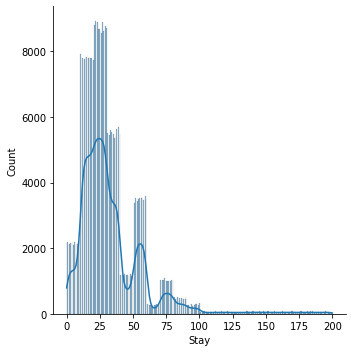

In [ ]:
import seaborn as sns

import matplotlib.pyplot as plt
sns.displot(train['Stay'],kde=True);

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


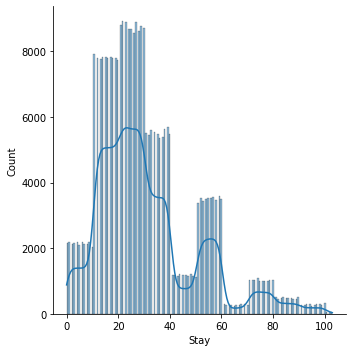

In [ ]:
# 이상치 제거
import numpy as np

train['Stay'] = train[train['Stay'] <np.percentile(train['Stay'], 98)]['Stay']
sns.displot(train['Stay'],kde=True);

In [ ]:
train = train[train['Stay'].notna()]

In [ ]:
train.shape

(312001, 16)

###기준모델

In [ ]:
t=train['Stay']
predict= t.mean()
predict

30.938102136442595

In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score
y_pred = [predict] * len(t)

mae = mean_absolute_error(t, y_pred)
r = r2_score(t, y_pred)

print(f'baseline MAE: ${mae:,.0f}')
print(f'baseline R2: {r} \n')


baseline MAE: $15
baseline R2: 0.0 



1. Data Leakage가 있었나요? 없었다면 어떻게 방지했나요?
없음 - 특성을 따로 만들진 않음

2. 임채은님이 만들고자 하는 모델은 언제 유용한가요? 어떤 한계를 가지고 있나요?

- 유용성: 병원에서 더 오래 머물 가능성이 높은 환자를 입원기간을 최소화하고 직원/방문객 감염 가능성을 낮춰서 최적화된 치료계획을 가질때, 객실 및 침대같이 물류를 배분할 때도 도움이 된다.
- 한계: 위 데이터에는 의료 상황에 대한 외부요인들을 포함하고 병원의 약물 보관방식이나 병원시설의 위생상태와 같이 내부요인은 포함하지 않았다는 한계가 있다 


## 머신러닝 방식 적용 및 교차검증 
[다중선형/릿지회귀/의사결정트리/ 랜덤포레스트/그래디언트(3가지 종류)]

In [ ]:
from sklearn.model_selection import train_test_split
X=train.drop(columns='Stay') #'price'를 제외한 df를 특성으로 지정
y=train['Stay']
X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                    test_size=0.2, 
                                                    random_state=2)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X,y,
                                                    test_size=0.2, 
                                                    random_state=2)

In [ ]:
X_train.shape, X_val.shape, X_test.shape

((249600, 15), (62401, 15), (62401, 15))

### 머신러닝 적용(하이파라미터 X, ordinal)

In [ ]:
# 다중 선형
from category_encoders import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression

pipe = make_pipeline(
    OneHotEncoder(use_cat_names=True), 
    SimpleImputer(),
    LinearRegression()
)

pipe.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['Hospital_type', 'Hospital_region',
                                     'Department', 'Ward_Type', 'Ward_Facility',
                                     'Type of Admission'],
                               drop_invariant=False, handle_missing='value',
                               handle_unknown='value', return_df=True,
                               use_cat_names=True, verbose=0)),
                ('simpleimputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='mean',
                               verbose=0)),
                ('linearregression',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

In [ ]:
y_pred =  pipe.predict(X_val)

mae = mean_absolute_error(y_val, y_pred)
r = r2_score(y_val, y_pred)

print(f'LinearRegression MAE: ${mae}')
print(f'LinearRegression R2: {r} \n')

LinearRegression MAE: $11.917767588425992
LinearRegression R2: 0.32606983726890093 



In [ ]:
#릿지회귀
from sklearn.linear_model import RidgeCV

pipe1 = make_pipeline(
    OneHotEncoder(use_cat_names=True), 
    SimpleImputer(), 
    RidgeCV()
)

pipe1.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['Hospital_type', 'Hospital_region',
                                     'Department', 'Ward_Type', 'Ward_Facility',
                                     'Type of Admission'],
                               drop_invariant=False, handle_missing='value',
                               handle_unknown='value', return_df=True,
                               use_cat_names=True, verbose=0)),
                ('simpleimputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='mean',
                               verbose=0)),
                ('ridgecv',
                 RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None,
                         fit_intercept=True, gcv_mode=None, normalize=False,
                         scoring=None, store_cv_values=False))],
         verbose=False)

In [ ]:
y_pred1 =  pipe1.predict(X_val)

mae1 = mean_absolute_error(y_val, y_pred1)
r1 = r2_score(y_val, y_pred)

print(f'RidgeCV MAE: ${mae1}')
print(f'RidgeCV R2: {r1} \n')

LinearRegression MAE: $11.949420741492425
LinearRegression R2: 0.32770416607807007 



In [ ]:
.3308416047369418 


In [ ]:
# 의사결정모델

from sklearn.tree import DecisionTreeRegressor

pipe2 = make_pipeline(
    OneHotEncoder(use_cat_names=True), 
    SimpleImputer(), 
    DecisionTreeRegressor(random_state=10) 
)
pipe2.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Pipeline(memory=None,
         steps=[('onehotencoder',
                 OneHotEncoder(cols=['Hospital_type', 'Hospital_region',
                                     'Department', 'Ward_Type', 'Ward_Facility',
                                     'Type of Admission'],
                               drop_invariant=False, handle_missing='value',
                               handle_unknown='value', return_df=True,
                               use_cat_names=True, verbose=0)),
                ('simpleimputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               m...nan, strategy='mean',
                               verbose=0)),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                       max_depth=None, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decre

In [ ]:
y_pred2 =  pipe2.predict(X_val)

mae2 = mean_absolute_error(y_val, y_pred2)
r2 = r2_score(y_val, y_pred2)

print(f'DecisionTreeRegressor MAE: ${mae}')
print(f'DecisionTreeRegressor R2: {r2} \n')

DecisionTreeRegressor MAE: $11.949425442919548
DecisionTreeRegressor R2: -0.19446296354421455 



In [ ]:
#랜덤포레스트 
from category_encoders import OrdinalEncoder
from sklearn.ensemble import RandomForestRegressor

pipe3 = make_pipeline(
    OrdinalEncoder(), 
    SimpleImputer(), 
    RandomForestRegressor(random_state=10) 
)
pipe3.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['Hospital_type', 'Hospital_region',
                                      'Department', 'Ward_Type',
                                      'Ward_Facility', 'Type of Admission'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='value',
                                mapping=[{'col': 'Hospital_type',
                                          'data_type': dtype('O'),
                                          'mapping': c      1
a      2
e      3
g      4
b      5
d      6
f      7
NaN   -2
dtype: int64},
                                         {'col': 'Hospital_region',...
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='mse', max_depth=None,
                                       max_features='auto', max_leaf_nodes=None,
                          

In [ ]:
y_pred3 =  pipe3.predict(X_val)

mae3 = mean_absolute_error(y_val, y_pred3)
r3 = r2_score(y_val, y_pred3)

print(f'RandomForestRegressor MAE: ${mae3}')
print(f'RandomForestRegressor R2: {r3} \n')

RandomForestRegressor MAE: $11.146652308891335
RandomForestRegressor R2: 0.3942182739653549 



In [ ]:
# 그래디언트 부스팅: XGB
from xgboost import XGBRegressor
pipe4 = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    XGBRegressor(random_state=10)                 
)
pipe4.fit(X_train, y_train);

[00:30:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
y_pred4 =  pipe4.predict(X_val)

mae4 = mean_absolute_error(y_val, y_pred4)
r4 = r2_score(y_val, y_pred4)

print(f'XGBRegressor MAE: ${mae4}')
print(f'XGBRegressor R2: {r4} \n')

XGBRegressor MAE: $11.125077171390481
XGBRegressor R2: 0.3957595690400716 



In [ ]:
#XGBRegressor MAE: $11.08472900903506
#XGBRegressor R2: 0.39925447781919976 

In [ ]:
from lightgbm import  LGBMRegressor
pipe5 = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    LGBMRegressor(random_state=10)                 
)

pipe5.fit(X_train, y_train);

In [ ]:
y_pred5 =  pipe5.predict(X_val)

mae5 = mean_absolute_error(y_val, y_pred5)
r5 = r2_score(y_val, y_pred5)

print(f'LGBMRegressor MAE: ${mae5}')
print(f'LGBMRegressor R2: {r5} \n')

LGBMRegressor MAE: $10.755746754896023
LGBMRegressor R2: 0.42813917729363116 



In [ ]:
#LGBMRegressor MAE: $10.756444826695251
#LGBMRegressor R2: 0.4279021521819263 

In [ ]:
from catboost import CatBoostRegressor

pipe6 = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    CatBoostRegressor(random_state=10)                 
)

pipe6.fit(X_train, y_train);
# https://blog.naver.com/chunsa0127/222251765153

Learning rate set to 0.104259
0:	learn: 18.5715142	total: 97ms	remaining: 1m 36s
1:	learn: 18.0217789	total: 138ms	remaining: 1m 9s
2:	learn: 17.5639427	total: 181ms	remaining: 1m
3:	learn: 17.1980581	total: 224ms	remaining: 55.9s
4:	learn: 16.8986708	total: 265ms	remaining: 52.7s
5:	learn: 16.6465470	total: 302ms	remaining: 50.1s
6:	learn: 16.4176167	total: 347ms	remaining: 49.2s
7:	learn: 16.2455555	total: 391ms	remaining: 48.5s
8:	learn: 16.1006245	total: 431ms	remaining: 47.5s
9:	learn: 15.9611340	total: 481ms	remaining: 47.6s
10:	learn: 15.8547709	total: 522ms	remaining: 47s
11:	learn: 15.7501255	total: 562ms	remaining: 46.3s
12:	learn: 15.6726322	total: 603ms	remaining: 45.8s
13:	learn: 15.5975759	total: 641ms	remaining: 45.1s
14:	learn: 15.5340112	total: 685ms	remaining: 45s
15:	learn: 15.4726043	total: 734ms	remaining: 45.1s
16:	learn: 15.4269741	total: 772ms	remaining: 44.7s
17:	learn: 15.3895844	total: 822ms	remaining: 44.9s
18:	learn: 15.3570995	total: 865ms	remaining: 44.7s

In [ ]:
y_pred6 =  pipe6.predict(X_val)

mae6 = mean_absolute_error(y_val, y_pred6)
r6 = r2_score(y_val, y_pred6)

print(f'CatBoostRegressor MAE: ${mae6}')
print(f'CatBoostRegressor R2: {r6} \n')

CatBoostRegressor MAE: $10.673871829277818
CatBoostRegressor R2: 0.43572598967684684 



In [ ]:
#CatBoostRegressor MAE: $10.672438709889681
#CatBoostRegressor R2: 0.4353969177670919 

### 머신러닝 적용(하이파라미터 X, Target)
- 그래디언트 모델 중심으로

In [ ]:
# 그래디언트 부스팅: XGB
from category_encoders import TargetEncoder
from xgboost import XGBRegressor
pipe4_ = make_pipeline(
    TargetEncoder(),
    SimpleImputer(),
    XGBRegressor(random_state=10)                 
)
pipe4_.fit(X_train, y_train);

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


[00:51:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
y_pred4_ =  pipe4_.predict(X_val)

mae4_ = mean_absolute_error(y_val, y_pred4_)
r4_ = r2_score(y_val, y_pred4_)

print(f' XGBRegressor MAE: ${mae4_:}')
print(f' XGBRegressor R2: {r4_} \n')

 XGBRegressor MAE: $10.996899396741306
 XGBRegressor R2: 0.407464691561056 



In [ ]:
 XGBRegressor MAE: $10.994086302944979
 XGBRegressor R2: 0.4075400418877716 

In [ ]:
from lightgbm import  LGBMRegressor
pipe5_ = make_pipeline(
    TargetEncoder(),
    SimpleImputer(),
    LGBMRegressor(random_state=10)                 
)

pipe5_.fit(X_train, y_train);

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [ ]:
y_pred5_ =  pipe5_.predict(X_val)

mae5_ = mean_absolute_error(y_val, y_pred5_)
r5_ = r2_score(y_val, y_pred5_)

print(f'LGBMRegressor MAE: ${mae5_}')
print(f'LGBMRegressor R2: {r5_} \n')

LGBMRegressor MAE: $10.741393437064998
LGBMRegressor R2: 0.42893796280276564 



In [ ]:
pipe6_ = make_pipeline(
    TargetEncoder(),
    SimpleImputer(),
    CatBoostRegressor(random_state=10)                 
)

pipe6_.fit(X_train, y_train);
# https://blog.naver.com/chunsa0127/22225176_5153

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Learning rate set to 0.104259
0:	learn: 18.5873668	total: 97.4ms	remaining: 1m 37s
1:	learn: 18.0419332	total: 138ms	remaining: 1m 8s
2:	learn: 17.5617170	total: 183ms	remaining: 1m
3:	learn: 17.1847845	total: 224ms	remaining: 55.9s
4:	learn: 16.8481583	total: 266ms	remaining: 52.9s
5:	learn: 16.5752319	total: 306ms	remaining: 50.8s
6:	learn: 16.3586063	total: 347ms	remaining: 49.2s
7:	learn: 16.1747960	total: 390ms	remaining: 48.4s
8:	learn: 16.0120003	total: 431ms	remaining: 47.5s
9:	learn: 15.8871192	total: 472ms	remaining: 46.7s
10:	learn: 15.7681057	total: 514ms	remaining: 46.2s
11:	learn: 15.6749830	total: 557ms	remaining: 45.8s
12:	learn: 15.6007808	total: 600ms	remaining: 45.6s
13:	learn: 15.5352764	total: 644ms	remaining: 45.3s
14:	learn: 15.4695335	total: 685ms	remaining: 45s
15:	learn: 15.4146331	total: 725ms	remaining: 44.6s
16:	learn: 15.3742305	total: 766ms	remaining: 44.3s
17:	learn: 15.3316081	total: 815ms	remaining: 44.5s
18:	learn: 15.2935578	total: 857ms	remaining: 4

In [ ]:
y_pred6_ =  pipe6_.predict(X_val)

mae6_ = mean_absolute_error(y_val, y_pred6_)
r6_ = r2_score(y_val, y_pred6_)

print(f' CatBoostRegressor MAE: ${mae6_}')
print(f' CatBoostRegressor R2: {r6_} \n')

 CatBoostRegressor MAE: $10.669248534025044
 CatBoostRegressor R2: 0.4357625070427673 



In [ ]:
 CatBoostRegressor MAE: $10.66572777418154
 CatBoostRegressor R2: 0.4364823997787042 

####오프더 레고드

In [ ]:
from catboost import CatBoostRegressor

pipe7_ = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    CatBoostRegressor(random_state=10)                 
)

pipe7_.fit(X_train, y_train);
# https://blog.naver.com/chunsa0127/22225177_5153

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Learning rate set to 0.104259
0:	learn: 18.5921509	total: 43.4ms	remaining: 43.4s
1:	learn: 18.0302032	total: 80.9ms	remaining: 40.4s
2:	learn: 17.5802745	total: 118ms	remaining: 39.3s
3:	learn: 17.2085531	total: 159ms	remaining: 39.5s
4:	learn: 16.8980213	total: 198ms	remaining: 39.3s
5:	learn: 16.6157579	total: 236ms	remaining: 39.1s
6:	learn: 16.3982662	total: 273ms	remaining: 38.7s
7:	learn: 16.2027112	total: 317ms	remaining: 39.3s
8:	learn: 16.0504344	total: 357ms	remaining: 39.4s
9:	learn: 15.9081232	total: 397ms	remaining: 39.3s
10:	learn: 15.8028444	total: 435ms	remaining: 39.1s
11:	learn: 15.6992678	total: 474ms	remaining: 39s
12:	learn: 15.6117125	total: 516ms	remaining: 39.2s
13:	learn: 15.5404891	total: 553ms	remaining: 38.9s
14:	learn: 15.4784644	total: 591ms	remaining: 38.8s
15:	learn: 15.4192046	total: 640ms	remaining: 39.4s
16:	learn: 15.3733047	total: 682ms	remaining: 39.4s
17:	learn: 15.3326704	total: 721ms	remaining: 39.3s
18:	learn: 15.2979200	total: 759ms	remaining

In [ ]:
y_pred7_ =  pipe7_.predict(X_val)

mae7_ = mean_absolute_error(y_val, y_pred7_)
r7_ = r2_score(y_val, y_pred7_)

print(f' CatBoostRegressor MAE: ${mae7_:,.0f}')
print(f' CatBoostRegressor R2: {r7_} \n')

 CatBoostRegressor MAE: $11
 CatBoostRegressor R2: 0.436149322466199 



#### Target으로 인코딩했을 때 ordinal으로 인코딩으로 했을 때보다 성능이 좋다 (유의미하지 않음)

### 순열 중요도 vs 특성 선택( 하이퍼파라미터 X, Target)

### 순열 중요도

In [ ]:
from sklearn.pipeline import Pipeline
pipe = Pipeline([
    ('preprocessing', make_pipeline(TargetEncoder(), SimpleImputer())),
    ('cb',CatBoostRegressor(random_state=10)) 
])

pipe.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


Learning rate set to 0.104259
0:	learn: 18.5873668	total: 46.6ms	remaining: 46.6s
1:	learn: 18.0419332	total: 92.7ms	remaining: 46.2s
2:	learn: 17.5617170	total: 146ms	remaining: 48.7s
3:	learn: 17.1847845	total: 209ms	remaining: 52.1s
4:	learn: 16.8481583	total: 252ms	remaining: 50.2s
5:	learn: 16.5752319	total: 298ms	remaining: 49.3s
6:	learn: 16.3586063	total: 336ms	remaining: 47.7s
7:	learn: 16.1747960	total: 376ms	remaining: 46.6s
8:	learn: 16.0120003	total: 422ms	remaining: 46.5s
9:	learn: 15.8871192	total: 463ms	remaining: 45.9s
10:	learn: 15.7681057	total: 505ms	remaining: 45.4s
11:	learn: 15.6749830	total: 552ms	remaining: 45.4s
12:	learn: 15.6007808	total: 593ms	remaining: 45s
13:	learn: 15.5352764	total: 638ms	remaining: 44.9s
14:	learn: 15.4695335	total: 683ms	remaining: 44.9s
15:	learn: 15.4146331	total: 723ms	remaining: 44.5s
16:	learn: 15.3742305	total: 761ms	remaining: 44s
17:	learn: 15.3316081	total: 801ms	remaining: 43.7s
18:	learn: 15.2935578	total: 853ms	remaining: 

Pipeline(memory=None,
         steps=[('preprocessing',
                 Pipeline(memory=None,
                          steps=[('targetencoder',
                                  TargetEncoder(cols=['Hospital_type',
                                                      'Hospital_region',
                                                      'Department', 'Ward_Type',
                                                      'Ward_Facility',
                                                      'Type of Admission'],
                                                drop_invariant=False,
                                                handle_missing='value',
                                                handle_unknown='value',
                                                min_samples_leaf=1,
                                                return_df=True, smoothing=1.0,
                                                verbose=0)),
                                 ('simpleimputer',
         

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import eli5
from eli5.sklearn import PermutationImportance

# permuter 정의
permuter = PermutationImportance(
    pipe.named_steps['cb'], 
    scoring='neg_mean_absolute_error',
    n_iter=5, 
    random_state=2
)

# permuter 계산은 preprocessing 된 X_val을 사용합니다.
X_val_transformed = pipe.named_steps['preprocessing'].transform(X_val)

# 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
permuter.fit(X_val_transformed, y_val);

In [ ]:
feature_names = X_val.columns.tolist()

eli5.show_weights(
    permuter, 
    top=None, # top n 지정 가능, None 일 경우 모든 특성 
    feature_names=feature_names # list 형식으로 넣어야 합니다
)

Weight,Feature
5.9278 ± 0.0513,Visitors
2.0738 ± 0.0324,Ward_Type
0.3708 ± 0.0108,City_Code_Patient
0.2274 ± 0.0115,Severity
0.2101 ± 0.0141,Ward_Facility
0.2085 ± 0.0056,Type of Admission
0.2068 ± 0.0057,Extra Rooms
0.1629 ± 0.0160,Hospital
0.1410 ± 0.0089,Admission_Deposit
0.1219 ± 0.0096,Bed Grade


In [ ]:
minimum_importance = 0.1

mask = permuter.feature_importances_ > minimum_importance
features = X_train.columns[mask]
X_train_selected = X_train[features]
X_val_selected = X_val[features]

In [ ]:
pipe_ = Pipeline([
    ('preprocessing', make_pipeline(TargetEncoder(), SimpleImputer())),
    ('cb', CatBoostRegressor(random_state=10)) 
], verbose=1)

pipe_.fit(X_train_selected, y_train);

[Pipeline] ..... (step 1 of 2) Processing preprocessing, total=   0.5s
Learning rate set to 0.104259
0:	learn: 18.5870017	total: 43.2ms	remaining: 43.2s
1:	learn: 18.0427346	total: 87ms	remaining: 43.4s
2:	learn: 17.5918297	total: 123ms	remaining: 40.8s
3:	learn: 17.2120909	total: 161ms	remaining: 40.2s
4:	learn: 16.9009718	total: 214ms	remaining: 42.5s
5:	learn: 16.6090650	total: 250ms	remaining: 41.5s
6:	learn: 16.3686317	total: 287ms	remaining: 40.7s
7:	learn: 16.1890398	total: 326ms	remaining: 40.4s
8:	learn: 16.0228244	total: 363ms	remaining: 40s
9:	learn: 15.8854710	total: 398ms	remaining: 39.4s
10:	learn: 15.7697016	total: 436ms	remaining: 39.2s
11:	learn: 15.6785989	total: 476ms	remaining: 39.2s
12:	learn: 15.5984087	total: 514ms	remaining: 39s
13:	learn: 15.5334090	total: 555ms	remaining: 39.1s
14:	learn: 15.4779646	total: 593ms	remaining: 39s
15:	learn: 15.4286561	total: 636ms	remaining: 39.1s
16:	learn: 15.3846040	total: 672ms	remaining: 38.8s
17:	learn: 15.3393607	total: 70

In [ ]:
y_pred7 =  pipe_.predict(X_val_selected)

mae7 = mean_absolute_error(y_val, y_pred7)
r7 = r2_score(y_val, y_pred7)

print(f'CatBoostRegressor MAE: ${mae7:,.0f}')
print(f'CatBoostRegressor R2: {r7} \n')

CatBoostRegressor MAE: $11
CatBoostRegressor R2: 0.4296271016913664 



### feature selection


In [ ]:
from sklearn.feature_selection import f_regression, SelectKBest
k=10

Encoder=TargetEncoder()
imputer=SimpleImputer()
selector = SelectKBest(score_func=f_regression, k=k)
model=CatBoostRegressor(random_state=10)

In [ ]:


## selctor 정의합니다.
Encoder=TargetEncoder()
imputer=SimpleImputer()
selector = SelectKBest(score_func=f_regression, k=k)
model=CatBoostRegressor(random_state=10)

X_train_encoded= Encoder.fit_transform(X_train, y_train)
X_val_encoded= Encoder.transform(X_val)

X_train_imputed= imputer.fit_transform(X_train_encoded, y_train)
X_val_imputed= imputer.transform(X_val_encoded)

X_train_selected = selector.fit_transform(X_train_imputed, y_train)
X_val_selected = selector.transform(X_val_imputed)


all_names = X_train.columns
selected_mask = selector.get_support()
selected_names = all_names[selected_mask]
print('Selected names: ', selected_names)

    
   
model.fit(X_train_selected, y_train)
y_pred = model.predict(X_train_selected)
mae = mean_absolute_error(y_train, y_pred)

    
y_pred = model.predict(X_val_selected)
mae = mean_absolute_error(y_val, y_pred)
r2 = r2_score(y_val, y_pred)

print(f'val MAE: ${mae:,.0f}')
print(f'val R2: {r2} \n')

Selected names:  Index(['Hospital', 'Hospital_type', 'Extra Rooms', 'Ward_Type',
       'Ward_Facility', 'Type of Admission', 'Severity', 'Visitors', 'Age',
       'Admission_Deposit'],
      dtype='object')
Learning rate set to 0.104259
0:	learn: 18.5821811	total: 46.2ms	remaining: 46.1s
1:	learn: 18.0370590	total: 84.7ms	remaining: 42.3s
2:	learn: 17.5819957	total: 130ms	remaining: 43.2s
3:	learn: 17.1774814	total: 168ms	remaining: 41.9s
4:	learn: 16.8643617	total: 212ms	remaining: 42.2s
5:	learn: 16.6098097	total: 252ms	remaining: 41.8s
6:	learn: 16.3948223	total: 289ms	remaining: 41s
7:	learn: 16.1978891	total: 325ms	remaining: 40.3s
8:	learn: 16.0485452	total: 366ms	remaining: 40.3s
9:	learn: 15.9070806	total: 403ms	remaining: 39.9s
10:	learn: 15.8000772	total: 440ms	remaining: 39.6s
11:	learn: 15.6955768	total: 483ms	remaining: 39.8s
12:	learn: 15.6115452	total: 519ms	remaining: 39.4s
13:	learn: 15.5401304	total: 555ms	remaining: 39.1s
14:	learn: 15.4783161	total: 591ms	remaining

#### 생략

In [ ]:
from sklearn.feature_selection import f_regression, SelectKBest

training = []
valing = []
ks = range(1, len(X_train.columns)+1)

for k in range(1, len(X_train.columns)+ 1):
    print(f'{k} features')

    Encoder=TargetEncoder()
    imputer=SimpleImputer()
    selector = SelectKBest(score_func=f_regression, k=k)
    model=CatBoostRegressor(random_state=10)
    
    X_train_encoded= Encoder.fit_transform(X_train, y_train)
    X_val_encoded= Encoder.transform(X_val)

    X_train_imputed= imputer.fit_transform(X_train_encoded, y_train)
    X_val_imputed= imputer.transform(X_val_encoded)

    X_train_selected = selector.fit_transform(X_train_imputed, y_train)
    X_val_selected = selector.transform(X_val_imputed)
    
    all_names = X_train.columns
    selected_mask = selector.get_support()
    selected_names = all_names[selected_mask]
    print('Selected names: ', selected_names)

    
   
    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_train_selected)
    mae = mean_absolute_error(y_train, y_pred)
    training.append(mae)
    
    y_pred = model.predict(X_val_selected)
    mae = mean_absolute_error(y_val, y_pred)
    r2 = r2_score(y_val, y_pred)
    valing.append(mae)
    print(f'val MAE: ${mae:,.0f}')
    print(f'val R2: {r2} \n')

plt.plot(ks, training, label='Training Score', color='b')
plt.plot(ks, valing, label='valing Score', color='g')
plt.ylabel("MAE ($)")
plt.xlabel("Number of Features")
plt.title('Validation Curve')
plt.legend()
plt.show()

###  머신러닝 (하이파라미터 , ordinal) - 대강

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

np.seterr(divide='ignore', invalid='ignore')

pipe4_ = make_pipeline(
    OrdinalEncoder(),
    XGBRegressor(random_state=10)                 
)

param = {
    'xgbregressor__max_depth':[5, 10, 15, 20, None],
    'xgbregressor__learning_rate':uniform(0.1,1),
    'xgbregressor__n_estimators':randint(50, 500), 
    'xgbregressor__scale_pos_weight':[10, 25, 50, 75, 99,100,None],
    'xgbregressor__n_jobs':[0,-1]
}
n_iter = 5
rs = RandomizedSearchCV(pipe4_,
                        param_distributions=param,
                        n_iter=n_iter, 
                        cv=3, 
                        scoring='neg_mean_absolute_error',
                        n_jobs=-1)


rs.fit(X_train, y_train);

[13:57:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
print('최적 하이퍼파라미터: ', rs.best_params_)
print('XGBRegressor MAE: ', -rs.best_score_)

최적 하이퍼파라미터:  {'xgbregressor__learning_rate': 0.9408078970368078, 'xgbregressor__max_depth': 15, 'xgbregressor__n_estimators': 211, 'xgbregressor__n_jobs': 0, 'xgbregressor__scale_pos_weight': 99}
XGBRegressor MAE:  14.981525710674939


In [ ]:
y_pred4_ =  rs.predict(X_val)

r4_ = r2_score(y_val, y_pred4_)
print(f'XGBRegressor R2: {-r4_} \n')

XGBRegressor R2: 0.05916903320400624 



In [ ]:
np.seterr(divide='ignore', invalid='ignore')

pipe5_ = make_pipeline(
    OrdinalEncoder(),
    LGBMRegressor(random_state=10)                 
)

param = {
    'lgbmregressor__max_depth':[5, 10, 15, 20, None],
    'lgbmregressor__learning_rate':uniform(0.1,1),
    'lgbmregressor__n_estimators':randint(50, 500), 
    'lgbmregressor__scale_pos_weight':[10, 25, 50, 75, 99,100,None],
    'lgbmregressor__n_jobs':[0,-1]
}
n_iter = 5
rs2 = RandomizedSearchCV(pipe5_,
                        param_distributions=param,
                        n_iter=n_iter, 
                        cv=3, 
                        scoring='neg_mean_absolute_error',
                        n_jobs=-1)


rs2.fit(X_train, y_train);

In [ ]:
y_pred5_ =  rs2.predict(X_val)
r5_ = r2_score(y_val, y_pred5_)

print('최적 하이퍼파라미터: ', rs.best_params_)
print('XGBRegressor MAE: ', -rs.best_score_)
print(f'XGBRegressor R2: {r5_} \n')

최적 하이퍼파라미터:  {'xgbregressor__learning_rate': 0.9408078970368078, 'xgbregressor__max_depth': 15, 'xgbregressor__n_estimators': 211, 'xgbregressor__n_jobs': 0, 'xgbregressor__scale_pos_weight': 99}
XGBRegressor MAE:  14.981525710674939
XGBRegressor R2: 0.4262674822101772 



In [ ]:
np.seterr(divide='ignore', invalid='ignore')

pipe6_ = make_pipeline(
    OrdinalEncoder(),
    CatBoostRegressor(random_state=10)                 
)


param = {
    'catboostregressor__max_depth':[5, 10, 15, 20, None],
    'catboostregressor__learning_rate':uniform(0.1,1),
    'catboostregressor__n_estimators':randint(50, 500)
}
n_iter = 5
rs3 = RandomizedSearchCV(pipe6_,
                        param_distributions=param,
                        n_iter=n_iter, 
                        cv=3, 
                        scoring='neg_mean_absolute_error',
                        n_jobs=-1)


rs3.fit(X_train, y_train);

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


0:	learn: 17.2796385	total: 61.1ms	remaining: 17.2s
1:	learn: 16.3957090	total: 103ms	remaining: 14.5s
2:	learn: 15.9025217	total: 140ms	remaining: 13s
3:	learn: 15.6576907	total: 185ms	remaining: 12.9s
4:	learn: 15.4774581	total: 222ms	remaining: 12.3s
5:	learn: 15.3553619	total: 259ms	remaining: 12s
6:	learn: 15.2676662	total: 300ms	remaining: 11.8s
7:	learn: 15.1996468	total: 339ms	remaining: 11.6s
8:	learn: 15.1507466	total: 375ms	remaining: 11.4s
9:	learn: 15.0926008	total: 412ms	remaining: 11.3s
10:	learn: 15.0620986	total: 445ms	remaining: 11s
11:	learn: 15.0310307	total: 482ms	remaining: 10.9s
12:	learn: 14.9941338	total: 518ms	remaining: 10.8s
13:	learn: 14.9639962	total: 554ms	remaining: 10.6s
14:	learn: 14.9430758	total: 590ms	remaining: 10.5s
15:	learn: 14.9298138	total: 622ms	remaining: 10.4s
16:	learn: 14.9068213	total: 659ms	remaining: 10.3s
17:	learn: 14.8918064	total: 697ms	remaining: 10.3s
18:	learn: 14.8835085	total: 729ms	remaining: 10.1s
19:	learn: 14.8644511	total

In [ ]:
y_pred6_ =  rs3.predict(X_val)
r6_ = r2_score(y_val, y_pred6_)

print('최적 하이퍼파라미터: ', rs.best_params_)
print('CatBoostRegressor MAE: ', -rs.best_score_)
print(f'CatBoostRegressor R2: {r6_} \n')

최적 하이퍼파라미터:  {'xgbregressor__learning_rate': 0.9408078970368078, 'xgbregressor__max_depth': 15, 'xgbregressor__n_estimators': 211, 'xgbregressor__n_jobs': 0, 'xgbregressor__scale_pos_weight': 99}
CatBoostRegressor MAE:  14.981525710674939
CatBoostRegressor R2: 0.43275289721261523 



### 하이퍼파라미터 조정

In [ ]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

np.seterr(divide='ignore', invalid='ignore')

pipe6_ = make_pipeline(
    TargetEncoder(),
    CatBoostRegressor(random_state=10)                 
)



param = {
    'targetencoder__smoothing': [2.,20.,50.,60.,100.,500.,1000.],
    'targetencoder__min_samples_leaf': randint(0, 10), 
    'catboostregressor__max_depth':[5, 10, 15, 20, None],
    'catboostregressor__learning_rate':uniform(0,1),
}
n_iter = 10

#scoring = {'MAE': 'neg_mean_absolute_error', 'R2': 'r2'}

rs_ = RandomizedSearchCV(pipe6_,
                        param_distributions=param,
                        n_iter=n_iter, 
                        cv=3, 
                        scoring='r2',
                        verbose=10, 
                        #refit='R2', 
                        return_train_score=True, 
                        n_jobs=-1)


rs_.fit(X_train, y_train);

In [ ]:
y_pred6_ =  rs_.predict(X_val)
r6_ = r2_score(y_val, y_pred6_)

print('최적 하이퍼파라미터: ', rs_.best_params_)
print('CatBoostRegressor MAE: ', rs_.best_score_)
print(f'CatBoostRegressor R2: {r6_} \n')

최적 하이퍼파라미터:  {'catboostregressor__learning_rate': 0.15513836571095696, 'catboostregressor__max_depth': 10, 'targetencoder__min_samples_leaf': 3, 'targetencoder__smoothing': 50.0}
CatBoostRegressor MAE:  0.41262701759648807
CatBoostRegressor R2: 0.42561638419044945 



In [ ]:
y_pred =  model.predict(X_val_encoded)

mae = mean_absolute_error(y_val, y_pred)
r = r2_score(y_val, y_pred)

print(f' CatBoostRegressor MAE: ${mae}')
print(f'CatBoostRegressor R2: {r} \n')

 CatBoostRegressor MAE: $10.657120725696842
CatBoostRegressor R2: 0.4365611735516546 



### 최종

In [ ]:
from catboost import CatBoostRegressor
encoder = TargetEncoder(min_samples_leaf= 3, smoothing= 50.0)
X_train_encoded = encoder.fit_transform(X_train, y_train) # 학습데이터
X_val_encoded = encoder.transform(X_val, y_val) # 검증데이터

model=CatBoostRegressor(n_estimators=1000,
                       learning_rate= 0.15513836571095696, 
                       max_depth= 10,
                       random_state=10)                 

    
eval_set = [(X_train_encoded, y_train), 
            (X_val_encoded, y_val)]

model.fit(X_train_encoded, y_train, 
          eval_set=eval_set,
          #eval_metric='error',
          early_stopping_rounds=50
         )            

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


0:	learn: 18.1682682	test: 18.1682682	test1: 18.1604649	best: 18.1604649 (0)	total: 149ms	remaining: 2m 28s
1:	learn: 17.3691909	test: 17.3691909	test1: 17.3553694	best: 17.3553694 (1)	total: 248ms	remaining: 2m 3s
2:	learn: 16.7700332	test: 16.7700332	test1: 16.7557232	best: 16.7557232 (2)	total: 342ms	remaining: 1m 53s
3:	learn: 16.3287413	test: 16.3287413	test1: 16.3121643	best: 16.3121643 (3)	total: 439ms	remaining: 1m 49s
4:	learn: 15.9896932	test: 15.9896932	test1: 15.9743158	best: 15.9743158 (4)	total: 530ms	remaining: 1m 45s
5:	learn: 15.7227966	test: 15.7227966	test1: 15.7076788	best: 15.7076788 (5)	total: 628ms	remaining: 1m 44s
6:	learn: 15.5391697	test: 15.5391697	test1: 15.5306858	best: 15.5306858 (6)	total: 729ms	remaining: 1m 43s
7:	learn: 15.3716379	test: 15.3716379	test1: 15.3656649	best: 15.3656649 (7)	total: 825ms	remaining: 1m 42s
8:	learn: 15.2542133	test: 15.2542133	test1: 15.2540831	best: 15.2540831 (8)	total: 920ms	remaining: 1m 41s
9:	learn: 15.1587763	test: 15

In [ ]:
X_test_encoded = encoder.transform(X_test, y_test) 
y_pred =  model.predict(X_test_encoded)

mae = mean_absolute_error(y_test, y_pred)
r = r2_score(y_test, y_pred)

print(f'CatBoostRegressor MAE: ${mae}')
print(f'CatBoostRegressor R2: {r} \n') #다시 돌리면서 더 낮게 나왔는데 ppt가 맞는거입니다!

CatBoostRegressor MAE: $10.712114131877668
CatBoostRegressor R2: 0.4358489777822544 



### 교차검증 

In [ ]:
from sklearn.model_selection import cross_val_score

k=5

scores = cross_val_score(model, X_train_encoded, y_train, cv=k, 
                  scoring='r2')
print(f'f1 for {k} folds:', scores)   

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
1:	learn: 17.4062063	total: 159ms	remaining: 1m 19s
2:	learn: 16.7987576	total: 231ms	remaining: 1m 16s
3:	learn: 16.3621546	total: 307ms	remaining: 1m 16s
4:	learn: 15.9917963	total: 377ms	remaining: 1m 14s
5:	learn: 15.7218311	total: 451ms	remaining: 1m 14s
6:	learn: 15.5338270	total: 525ms	remaining: 1m 14s
7:	learn: 15.3793075	total: 614ms	remaining: 1m 16s
8:	learn: 15.2500827	total: 692ms	remaining: 1m 16s
9:	learn: 15.1516669	total: 771ms	remaining: 1m 16s
10:	learn: 15.0725332	total: 848ms	remaining: 1m 16s
11:	learn: 15.0066781	total: 926ms	remaining: 1m 16s
12:	learn: 14.9582993	total: 1s	remaining: 1m 16s
13:	learn: 14.9169515	total: 1.08s	remaining: 1m 16s
14:	learn: 14.8863833	total: 1.16s	remaining: 1m 15s
15:	learn: 14.8456225	total: 1.23s	remaining: 1m 15s
16:	learn: 14.8096944	total: 1.31s	remaining: 1m 15s
17:	learn: 14.7910557	total: 1.39s	remaining: 1m 15s
18:	learn: 14.7619360	total: 1.46s	remaining: 1m 15s
19:	learn: 14.7394278	

In [ ]:
scores

array([0.42039002, 0.4160469 , 0.4171521 , 0.41886786, 0.4172264 ])

In [ ]:
scores.mean()

0.4179366544657818

In [ ]:
from sklearn.model_selection import cross_val_score

k=5

scores = cross_val_score(model, X_train_encoded, y_train, cv=k, 
                  scoring='neg_mean_absolute_error')
print(f'f1 for {k} folds:', scores)  

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
1:	learn: 17.4062063	total: 147ms	remaining: 1m 13s
2:	learn: 16.7987576	total: 222ms	remaining: 1m 13s
3:	learn: 16.3621546	total: 297ms	remaining: 1m 13s
4:	learn: 15.9917963	total: 369ms	remaining: 1m 13s
5:	learn: 15.7218311	total: 441ms	remaining: 1m 13s
6:	learn: 15.5338270	total: 516ms	remaining: 1m 13s
7:	learn: 15.3793075	total: 593ms	remaining: 1m 13s
8:	learn: 15.2500827	total: 665ms	remaining: 1m 13s
9:	learn: 15.1516669	total: 756ms	remaining: 1m 14s
10:	learn: 15.0725332	total: 852ms	remaining: 1m 16s
11:	learn: 15.0066781	total: 929ms	remaining: 1m 16s
12:	learn: 14.9582993	total: 1.01s	remaining: 1m 16s
13:	learn: 14.9169515	total: 1.09s	remaining: 1m 16s
14:	learn: 14.8863833	total: 1.17s	remaining: 1m 16s
15:	learn: 14.8456225	total: 1.25s	remaining: 1m 16s
16:	learn: 14.8096944	total: 1.32s	remaining: 1m 16s
17:	learn: 14.7910557	total: 1.4s	remaining: 1m 16s
18:	learn: 14.7619360	total: 1.48s	remaining: 1m 16s
19:	learn: 14.739427

In [ ]:
-scores

array([10.87161319, 10.8256459 , 10.85962674, 10.91061464, 10.87512533])

In [ ]:
-scores.mean()

10.868525159569531

In [ ]:
scores.std()

0.027358490502475154

- 모델을 학습한 후에 베이스라인보다 잘 나왔나요? 그렇지 않다면 그 이유는 무엇일까요?
: 잘 나왔다
- 모델 성능 개선을 위해 어떤 방법을 적용했나요? 그 방법을 선택한 이유는 무엇인가요?
: 랜덤서치를 사용하여 하이퍼파라미터 튜닝하였다.

why? 그리드 서치보다 시간을 절약하고 최적의 파라미터를 찾을 수 있어서
- 최종 모델에 관해 설명하세요.

## 머신러닝 모델 해석

### one-pdp

- Visitors 
- Ward_Type 
- Severity 
------------------------------
- Hospital_type
- Hospital_region 


In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 144

In [ ]:
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'Visitors'

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


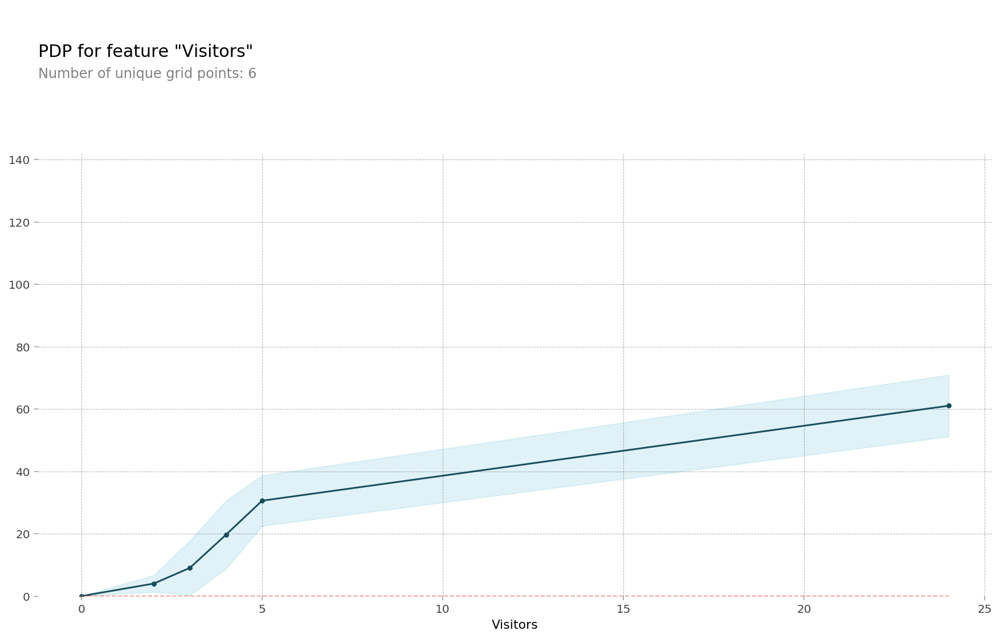

In [ ]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    grid_type='percentile', # default='percentile', or 'equal'
    num_grid_points=10 # default=10
)
pdp_plot(isolated, feature_name=feature);
#y는 이자율임 즉 -2 -> -2 이자율(2% 낮아진다)

In [ ]:
feature = 'Ward_Type'

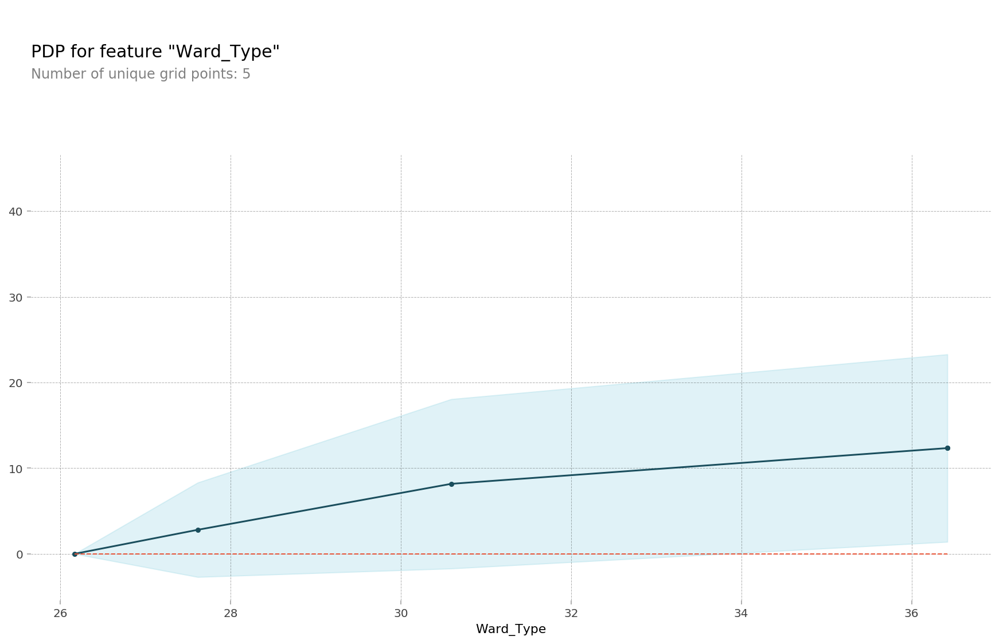

In [ ]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    grid_type='percentile', # default='percentile', or 'equal'
    num_grid_points=10 # default=10
)
pdp_plot(isolated, feature_name=feature);
#y는 이자율임 즉 -2 -> -2 이자율(2% 낮아진다)

In [ ]:
feature = 'Severity'

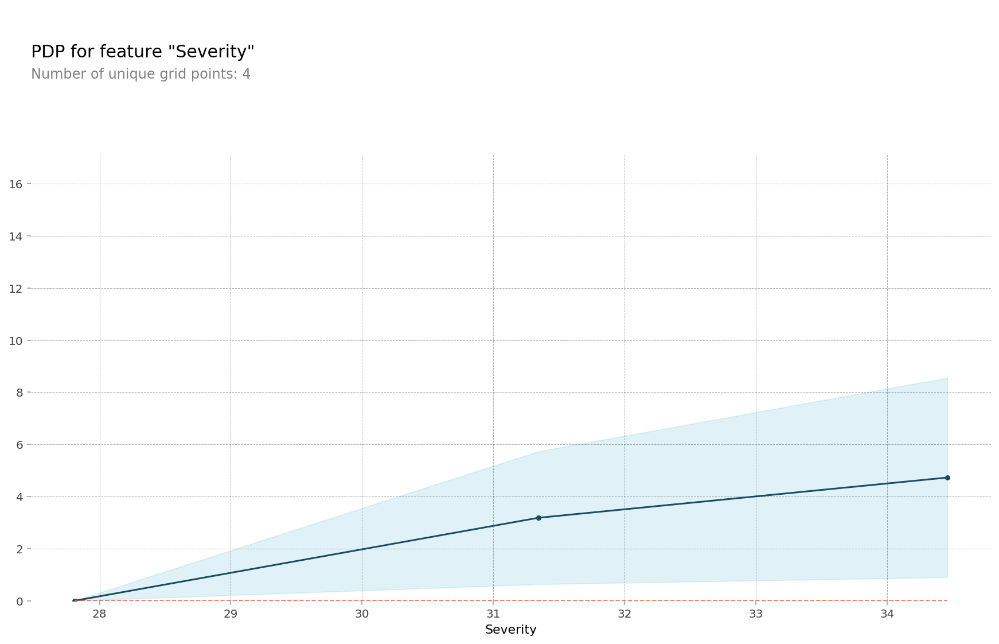

In [ ]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    grid_type='percentile', # default='percentile', or 'equal'
    num_grid_points=10 # default=10
)
pdp_plot(isolated, feature_name=feature);
#y는 이자율임 즉 -2 -> -2 이자율(2% 낮아진다)

In [ ]:
feature = 'Hospital_type'

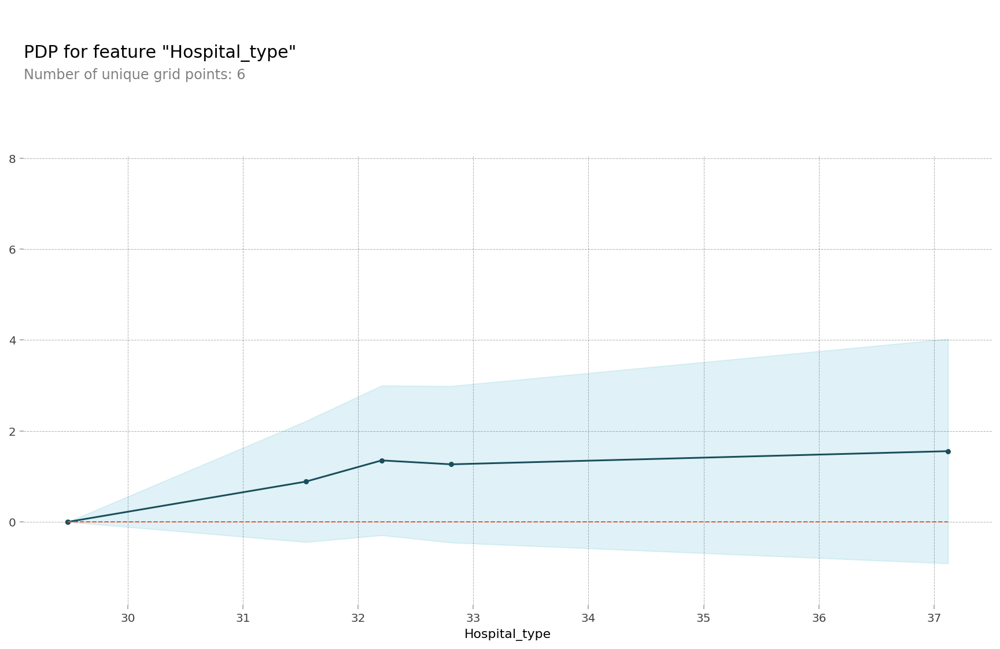

In [ ]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    grid_type='percentile', # default='percentile', or 'equal'
    num_grid_points=10 # default=10
)
pdp_plot(isolated, feature_name=feature);
#y는 이자율임 즉 -2 -> -2 이자율(2% 낮아진다)

In [ ]:
feature = 'Hospital_region'

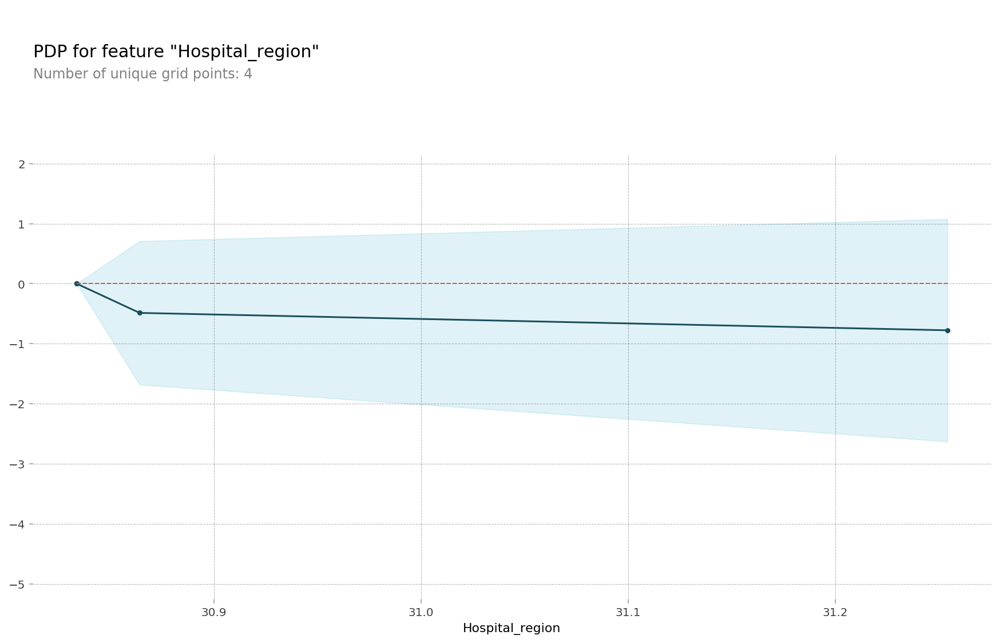

In [ ]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    grid_type='percentile', # default='percentile', or 'equal'
    num_grid_points=10 # default=10
)
pdp_plot(isolated, feature_name=feature);
#y는 이자율임 즉 -2 -> -2 이자율(2% 낮아진다)

In [ ]:
feature = 'Bed Grade'

isolated = pdp_isolate(
    model=model, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    grid_type='percentile', # default='percentile', or 'equal'
    num_grid_points=10 # default=10
)
pdp_plot(isolated, feature_name=feature);
#y는 이자율임 즉 -2 -> -2 이자율(2% 낮아진다)

ValueError: ignored

### Two pdp

In [ ]:
from pdpbox.pdp import pdp_interact, pdp_interact_plot

In [ ]:
X_train.head(50)

,Hospital,Hospital_type,City_Code_Hospital,Hospital_region,Extra Rooms,Department,Ward_Type,Ward_Facility,Bed Grade,City_Code_Patient,Type of Admission,Severity,Visitors,Age,Admission_Deposit
151401,26,b,2,Y,3,gynecology,Q,D,2.0,2.0,Trauma,3,2,4,4873.0
187928,28,b,11,X,2,radiotherapy,R,F,3.0,1.0,Trauma,3,6,9,6945.0
99066,24,a,1,X,4,gynecology,Q,E,2.0,1.0,Urgent,2,4,6,2691.0
107523,1,d,10,Y,3,gynecology,R,B,3.0,7.0,Trauma,2,2,2,5332.0
72345,23,a,6,X,3,gynecology,Q,F,2.0,8.0,Trauma,2,3,7,4250.0
309554,31,c,3,Z,2,gynecology,S,A,4.0,8.0,Trauma,2,2,8,4992.0
32157,26,b,2,Y,4,gynecology,Q,D,2.0,2.0,Trauma,3,2,4,3759.0
26577,17,e,1,X,4,gynecology,R,E,3.0,10.0,Trauma,2,2,3,5454.0
198938,27,a,7,Y,2,gynecology,Q,C,3.0,8.0,Trauma,1,2,2,4423.0
122471,6,a,6,X,3,gynecology,R,F,3.0,1.0,Trauma,2,9,9,3173.0


In [ ]:
X_train_encoded.head(50)

,Hospital,Hospital_type,City_Code_Hospital,Hospital_region,Extra Rooms,Department,Ward_Type,Ward_Facility,Bed Grade,City_Code_Patient,Type of Admission,Severity,Visitors,Age,Admission_Deposit
151401,26,32.280800,2,30.853429,3,31.133686,27.613887,32.366301,2.0,2.0,32.950809,3,2,4,4873.0
187928,28,32.280800,11,30.809995,2,31.304175,30.603439,31.385868,3.0,1.0,32.950809,3,6,9,6945.0
99066,24,29.408215,1,30.809995,4,31.133686,27.613887,29.847592,2.0,1.0,29.288923,2,4,6,2691.0
107523,1,32.710360,10,30.853429,3,31.133686,30.603439,32.849632,3.0,7.0,32.950809,2,2,2,5332.0
72345,23,29.408215,6,30.809995,3,31.133686,27.613887,31.385868,2.0,8.0,32.950809,2,3,7,4250.0
309554,31,31.663615,3,31.325451,2,31.133686,36.418522,31.564409,4.0,8.0,32.950809,2,2,8,4992.0
32157,26,32.280800,2,30.853429,4,31.133686,27.613887,32.366301,2.0,2.0,32.950809,3,2,4,3759.0
26577,17,30.757299,1,30.809995,4,31.133686,30.603439,29.847592,3.0,10.0,32.950809,2,2,3,5454.0
198938,27,29.408215,7,30.853429,2,31.133686,27.613887,26.679934,3.0,8.0,32.950809,1,2,2,4423.0
122471,6,29.408215,6,30.809995,3,31.133686,30.603439,31.385868,3.0,1.0,32.950809,2,9,9,3173.0


In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 249600 entries, 151401 to 102906
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Hospital            249600 non-null  int64  
 1   Hospital_type       249600 non-null  object 
 2   City_Code_Hospital  249600 non-null  int64  
 3   Hospital_region     249600 non-null  object 
 4   Extra Rooms         249600 non-null  int64  
 5   Department          249600 non-null  object 
 6   Ward_Type           249600 non-null  object 
 7   Ward_Facility       249600 non-null  object 
 8   Bed Grade           249516 non-null  float64
 9   City_Code_Patient   246107 non-null  float64
 10  Type of Admission   249600 non-null  object 
 11  Severity            249600 non-null  int64  
 12  Visitors            249600 non-null  int64  
 13  Age                 249600 non-null  int64  
 14  Admission_Deposit   249600 non-null  float64
dtypes: float64(3), int64(6), obje

In [ ]:
X_train_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 249600 entries, 151401 to 102906
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Hospital            249600 non-null  int64  
 1   Hospital_type       249600 non-null  float64
 2   City_Code_Hospital  249600 non-null  int64  
 3   Hospital_region     249600 non-null  float64
 4   Extra Rooms         249600 non-null  int64  
 5   Department          249600 non-null  float64
 6   Ward_Type           249600 non-null  float64
 7   Ward_Facility       249600 non-null  float64
 8   Bed Grade           249516 non-null  float64
 9   City_Code_Patient   246107 non-null  float64
 10  Type of Admission   249600 non-null  float64
 11  Severity            249600 non-null  int64  
 12  Visitors            249600 non-null  int64  
 13  Age                 249600 non-null  int64  
 14  Admission_Deposit   249600 non-null  float64
dtypes: float64(9), int64(6)
memor

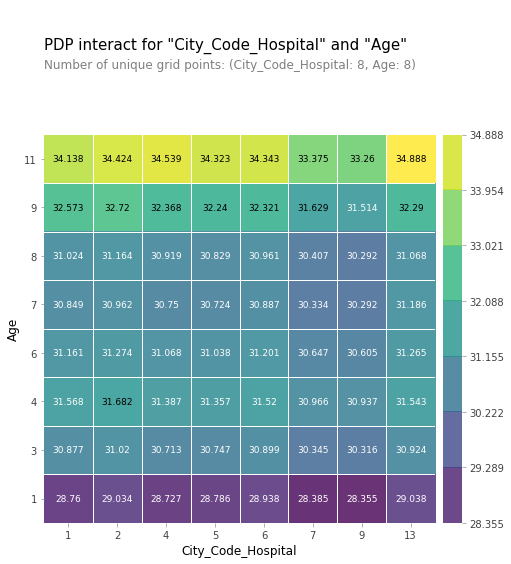

In [ ]:
features = ['City_Code_Hospital','Age']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

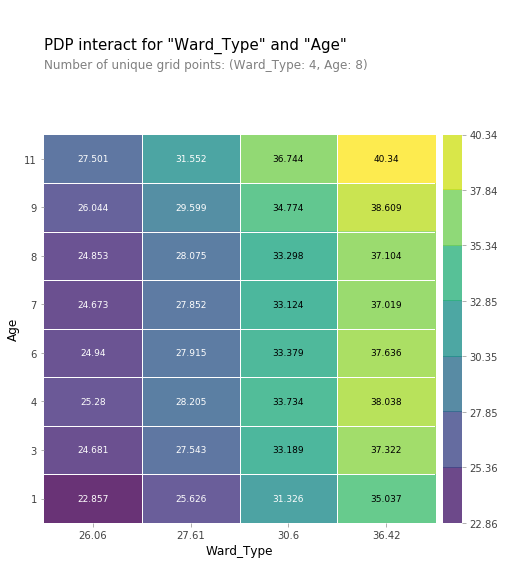

In [ ]:
features = ['Ward_Type','Age']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

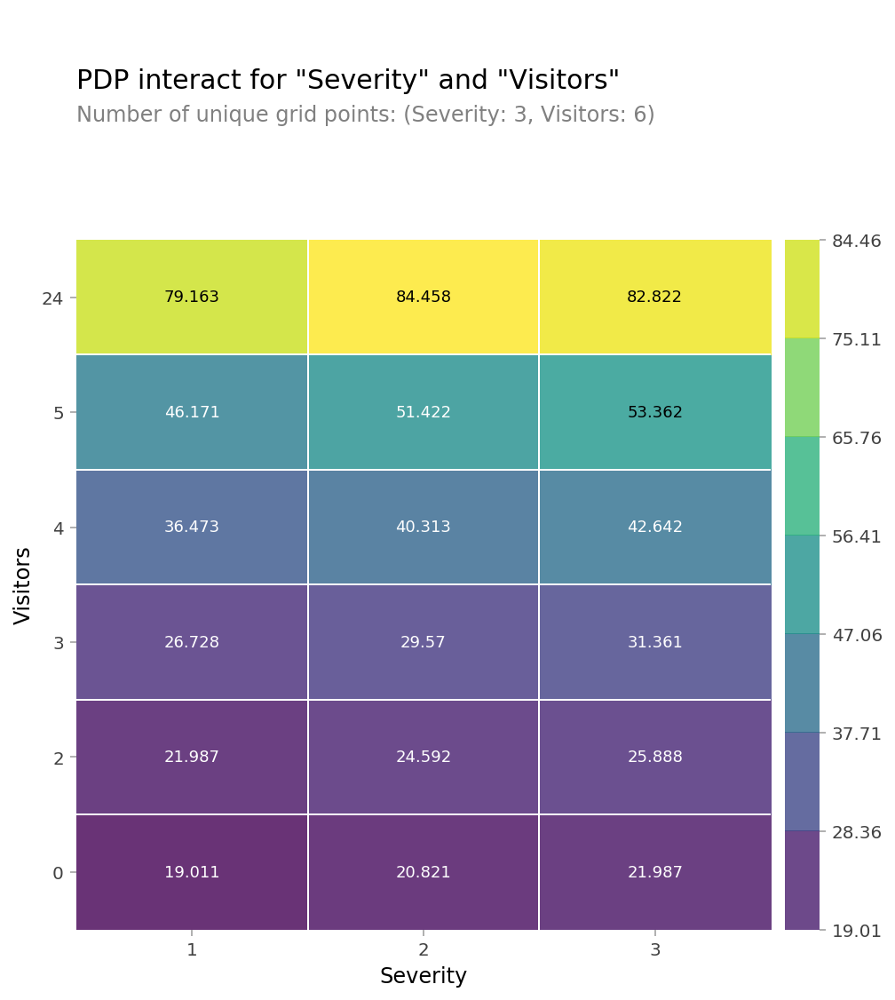

In [ ]:
features = ['Severity','Visitors']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

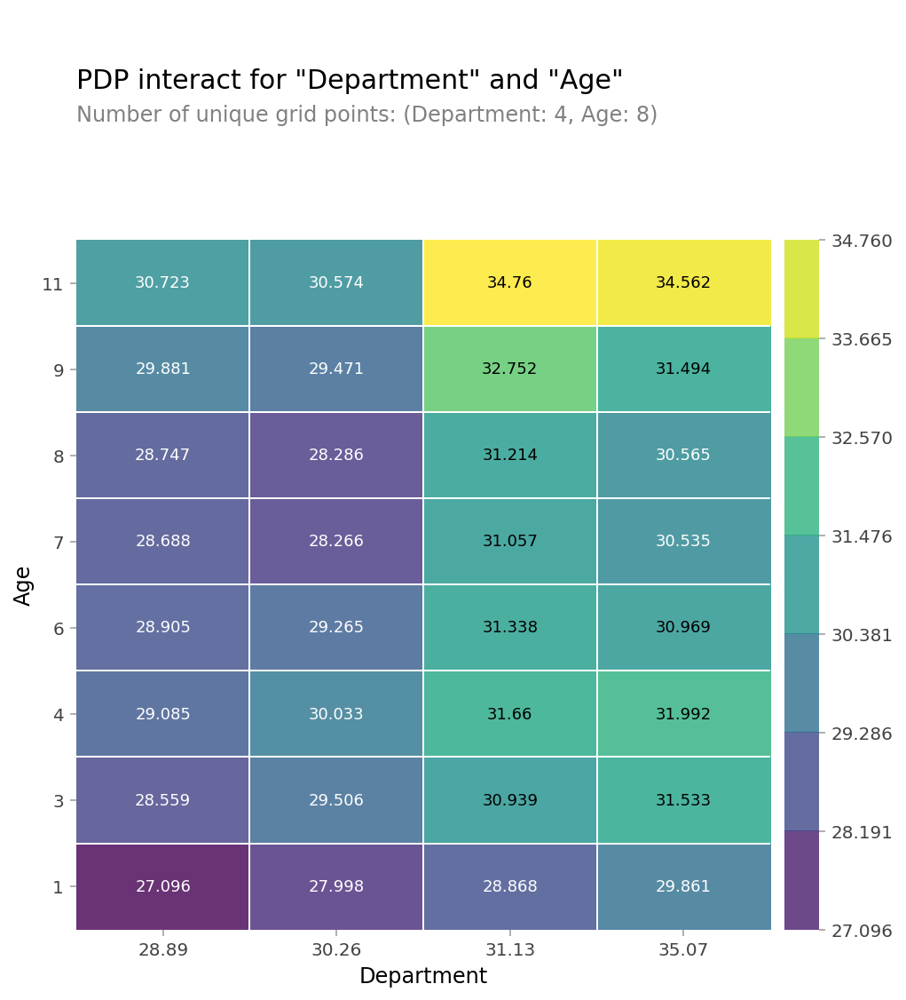

In [ ]:
features = ['Department','Age']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

(<Figure size 1080x1368 with 3 Axes>,
 {'pdp_inter_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fd65aca3310>,
  'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fd65b09c150>})

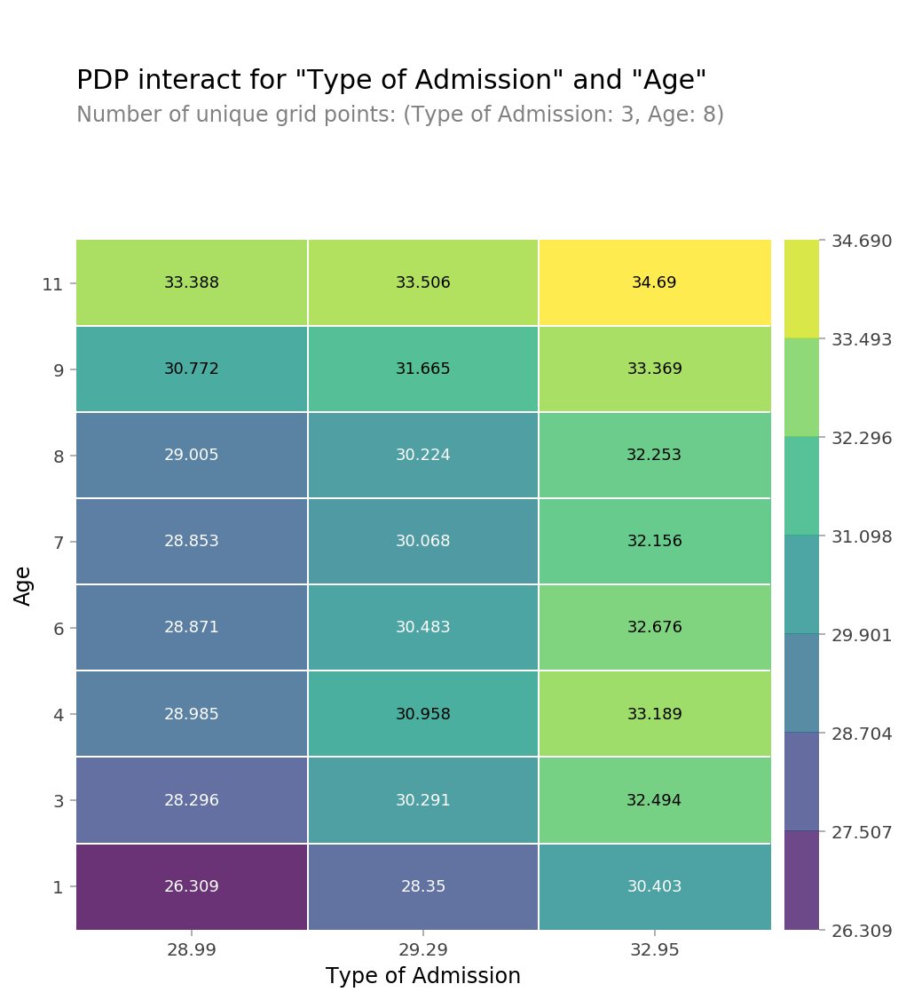

In [ ]:

features = ['Type of Admission','Age']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features)

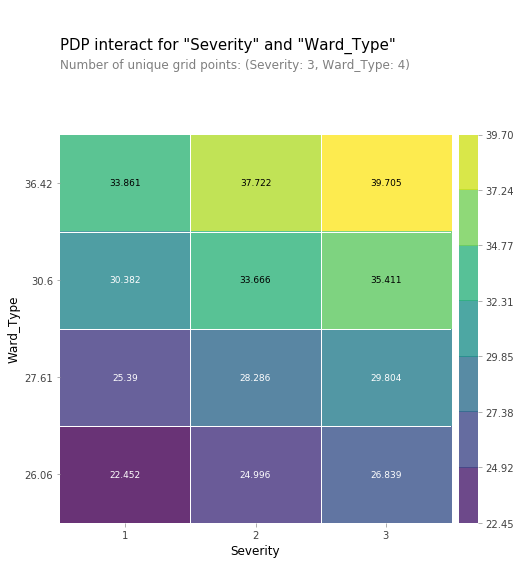

In [ ]:
features = ['Severity','Ward_Type']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

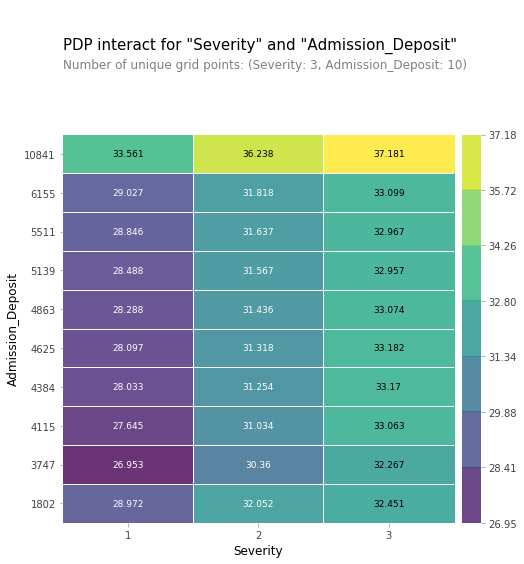

In [ ]:
features = ['Severity','Admission_Deposit']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

In [ ]:
features = ['Bed Grade','Extra Rooms']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

ValueError: ignored

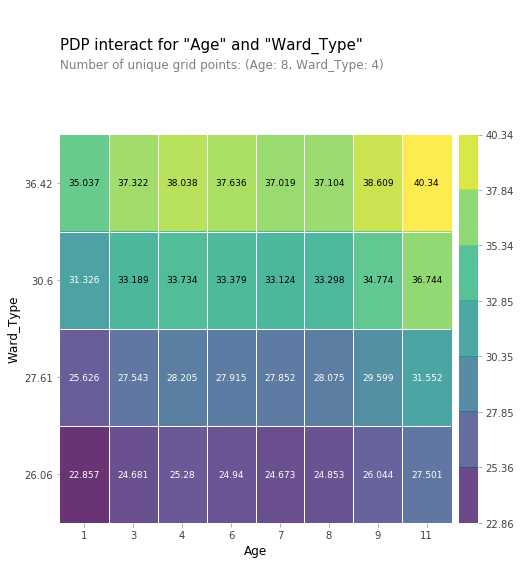

In [ ]:
features = ['Age','Ward_Type']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


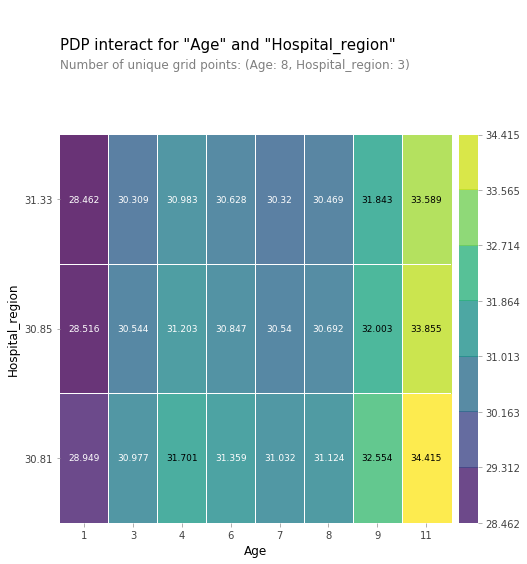

In [ ]:
features = ['Age','Hospital_region']


interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

In [ ]:
features = ['Age','Ward_Type']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

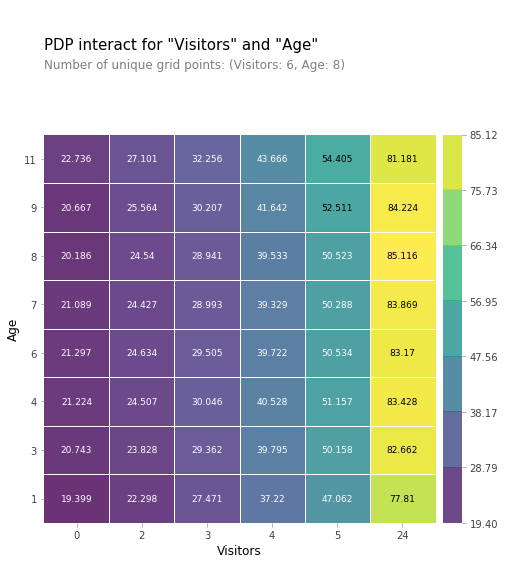

In [ ]:
features = ['Visitors', 'Age']

interaction = pdp_interact(
    model=model, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

NameError: ignored

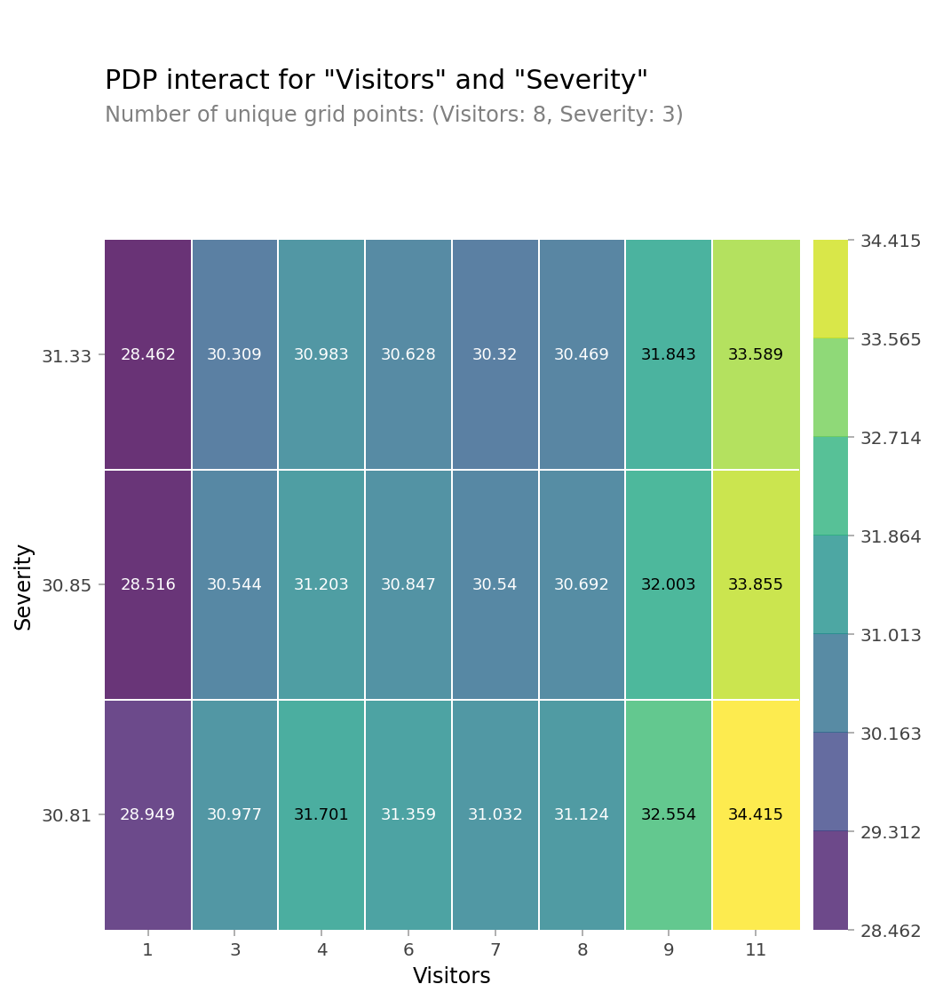

In [ ]:
features = ['Visitors', 'Severity']
pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);




In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 249600 entries, 151401 to 102906
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Hospital            249600 non-null  int64  
 1   Hospital_type       249600 non-null  object 
 2   City_Code_Hospital  249600 non-null  int64  
 3   Hospital_region     249600 non-null  object 
 4   Extra Rooms         249600 non-null  int64  
 5   Department          249600 non-null  object 
 6   Ward_Type           249600 non-null  object 
 7   Ward_Facility       249600 non-null  object 
 8   Bed Grade           249516 non-null  float64
 9   City_Code_Patient   246107 non-null  float64
 10  Type of Admission   249600 non-null  object 
 11  Severity            249600 non-null  int64  
 12  Visitors            249600 non-null  int64  
 13  Age                 249600 non-null  int64  
 14  Admission_Deposit   249600 non-null  float64
dtypes: float64(3), int64(6), obje

In [ ]:
X_train['Bed Grade'].value_counts()

2.0    97649
3.0    86397
4.0    44656
1.0    20814
Name: Bed Grade, dtype: int64

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


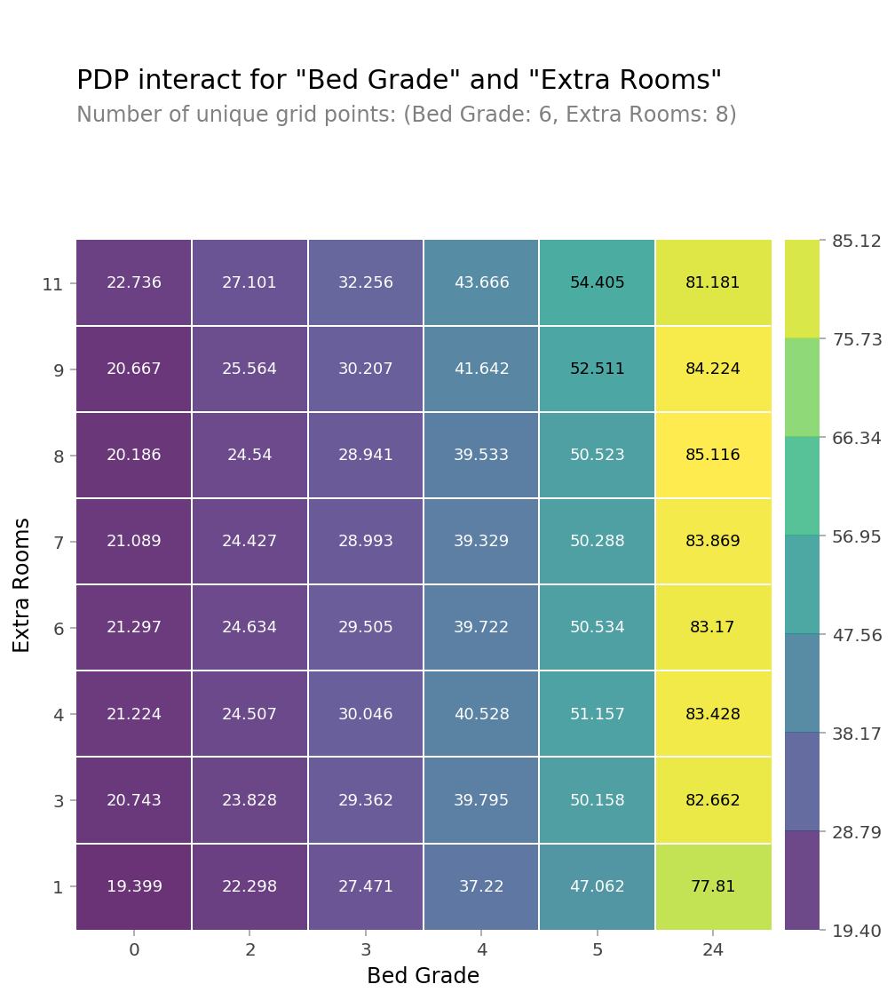

In [ ]:
features = ['Bed Grade', 'Extra Rooms']

pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

### Shap

In [ ]:
row = X_test_encoded.iloc[[10000]]

In [ ]:
y_test.iloc[[10000]]

130688    27.0
Name: Stay, dtype: float64

In [ ]:
model.predict(row)

array([14.78198783])

In [ ]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(row)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=row
)    

In [ ]:
row2 = X_test_encoded.iloc[[20000]]
model.predict(row2)

import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(row2)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=row2
)

In [ ]:
row3 = X_test_encoded.iloc[[30000]]
model.predict(row3)

import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(row3)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=row3
)

In [ ]:
shap.initjs()
shap_values = explainer.shap_values(X_test_encoded.iloc[:1000])
shap.force_plot(explainer.expected_value, shap_values, X_test_encoded.iloc[:1000])

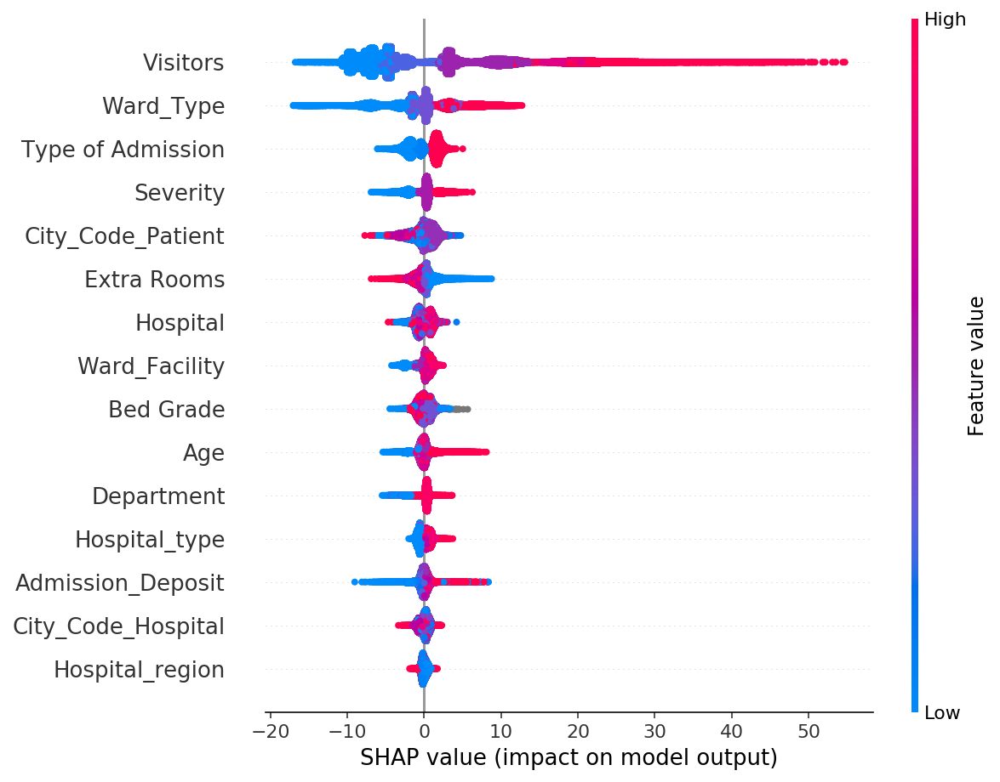

In [ ]:
shap_values = explainer.shap_values(X_test_encoded)
shap.summary_plot(shap_values, X_test_encoded)

In [ ]:
encoder = TargetEncoder(min_samples_leaf= 3, smoothing= 50.0)
X_train_encoded = encoder.fit_transform(X_train, y_train) # 학습데이터
X_val_encoded = encoder.transform(X_val, y_val) #

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 312014 entries, 0 to 318437
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Hospital            312014 non-null  int64  
 1   Hospital_type       312014 non-null  object 
 2   City_Code_Hospital  312014 non-null  int64  
 3   Hospital_region     312014 non-null  object 
 4   Extra Rooms         312014 non-null  int64  
 5   Department          312014 non-null  object 
 6   Ward_Type           312014 non-null  object 
 7   Ward_Facility       312014 non-null  object 
 8   Bed Grade           311903 non-null  float64
 9   City_Code_Patient   307609 non-null  float64
 10  Type of Admission   312014 non-null  object 
 11  Severity            312014 non-null  object 
 12  Visitors            312014 non-null  int64  
 13  Age                 312014 non-null  object 
 14  Admission_Deposit   312014 non-null  float64
 15  Stay                312014 non-nul

#### 예측함수

In [ ]:
def predict(Vistors, Ward_Type, Age, Severity):

    train = pd.DataFrame(
        data=[[Vistors, Ward_Type, Age, Severity]], 
        columns=['Vistors', 'Ward_Type', 'Type of Admission', 'Severity']
    )
    encoder1= OrdinalEncoder()
    train_end =encoder1.fit_transform(train, y_train)
    
    # 예측
    pred = model.predict(train_end)[0]

    # Shap value를 계산합니다
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(train_end)

    # Shap value, 특성이름, 특성값을 가지는 Series를 만듭니다
    feature_names = train_end.columns
    feature_values = train_end.values[0]
    shaps = pd.Series(shap_values[0], zip(feature_names, feature_values)) 

    # 결과를 프린트 합니다.
    result = f'평균입원 기간: ${explainer.expected_value[0]:,.0f} \n'
    result += f'예측입원 기간: ${pred:,.0f}. \n'
    result += shaps.to_straing()
    print(result)


    # SHAP Force Plot
    shap.initjs()
    return shap.force_plot(
        base_value=explainer.expected_value, 
        shap_values=shap_values, 
        features=train_end
    )

In [ ]:
X_train.info( )

<class 'pandas.core.frame.DataFrame'>
Int64Index: 249611 entries, 139924 to 102904
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Hospital            249611 non-null  int64  
 1   Hospital_type       249611 non-null  object 
 2   City_Code_Hospital  249611 non-null  int64  
 3   Hospital_region     249611 non-null  object 
 4   Extra Rooms         249611 non-null  int64  
 5   Department          249611 non-null  object 
 6   Ward_Type           249611 non-null  object 
 7   Ward_Facility       249611 non-null  object 
 8   Bed Grade           249522 non-null  float64
 9   City_Code_Patient   246095 non-null  float64
 10  Type of Admission   249611 non-null  object 
 11  Severity            249611 non-null  object 
 12  Visitors            249611 non-null  int64  
 13  Age                 249611 non-null  object 
 14  Admission_Deposit   249611 non-null  float64
dtypes: float64(3), int64(4), obje

In [ ]:
encoder1= OrdinalEncoder()
encoder1.fit_transform(train, y_train)

,Hospital,Hospital_type,City_Code_Hospital,Hospital_region,Extra Rooms,Department,Ward_Type,Ward_Facility,Bed Grade,City_Code_Patient,Type of Admission,Severity,Visitors,Age,Admission_Deposit,Stay
0,8,1,3,1,3,1,1,1,2.0,7.0,1,1,2,1,4911.0,2.0
1,2,1,5,1,2,1,2,1,2.0,7.0,2,1,2,1,5954.0,50.0
2,10,2,1,2,2,2,2,2,2.0,7.0,2,1,2,1,4745.0,32.0
3,26,3,2,3,2,1,1,3,2.0,7.0,2,1,2,1,7272.0,45.0
4,26,3,2,3,2,1,2,3,2.0,7.0,2,1,2,1,5558.0,42.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,6,4,6,2,3,1,3,1,4.0,23.0,1,2,3,4,4144.0,17.0
318434,24,4,1,2,2,2,3,2,4.0,8.0,3,2,4,5,6699.0,36.0
318435,7,4,4,2,3,3,1,1,4.0,10.0,1,3,3,2,4235.0,17.0
318436,11,3,2,3,3,2,3,3,3.0,8.0,2,3,5,8,3761.0,19.0


In [ ]:
predict(Vistors, Ward_Type, Age, Severity)

In [ ]:
predict(2,1,4911.0,2)

CatBoostError: ignored

## 다중 클래스로 (실패)

In [ ]:
import pandas as pd

train1= pd.read_csv('train (1).csv')

In [ ]:
import random

random.seed(1)
def stay_cat_encoder(x):
    if x == '0-10':
        return int(1)
    elif x == '11-20':
        return int(2)
    elif x == '21-30':
        return int(3)
    elif x == '31-40':
        return int(4)
    elif x == '41-50':
        return int(6)
    elif x == '51-60':
        return int(7)
    elif x == '61-70':
        return int(8)
    elif x == '71-80':
        return int(9)
    elif x == '81-90':
        return int(10)
    elif x == '91-100':
        return int(11)
    elif x == 'More than 100 Days':
        return int(12)

In [ ]:
random.seed(1)
def Severity_encoder(x):
    if x == 'Minor':
        return int(1)
    elif x == 'Moderate':
        return int(2)
    elif x == 'Extreme':
        return int(3)

In [ ]:
random.seed(1)
def Age_encoder(x):
    if x == '0-10':
        return int(1)
    elif x == '11-20':
        return int(2)
    elif x == '21-30':
        return int(3)
    elif x == '31-40':
        return int(4)
    elif x == '41-50':
        return int(6)
    elif x == '51-60':
        return int(7)
    elif x == '61-70':
        return int(8)
    elif x == '71-80':
        return int(9)
    elif x == '81-90':
        return int(10)
    elif x == '91-100':
        return int(11)
    elif x == 'More than 100 Days':
        return int(12)

In [ ]:
train1['Stay_re'] = train1['Stay'].apply(stay_cat_encoder)
train1= train1.drop('Stay', axis=1)

In [ ]:
train1['Severity of Illness'] = train1['Severity of Illness'].apply(Severity_encoder)
#train1= train1.drop('Severity of Illness', axis=1)

In [ ]:
train1['Age'] = train1['Age'].apply(Age_encoder)
#train1= train1.drop('Age', axis=1)

In [ ]:
def clean(df):
  df= df.drop('case_id', axis=1)
  df= df.drop('patientid', axis=1)
  
  df=df.rename(columns={'Hospital_code':'Hospital', 'Hospital_type_code':'Hospital_type','Hospital_region_code':'Hospital_region', 'Available Extra Rooms in Hospital':'Extra Rooms','Ward_Facility_Code':'Ward_Facility', 'Severity of Illness': 'Severity',
                      'Visitors with Patient':'Visitors','Admission_Deposit	':'Deposit', 'Stay_re':'Stay'})  
  return df
 
train1= clean(train1)

In [ ]:
train1.head()

,Hospital,Hospital_type,City_Code_Hospital,Hospital_region,Extra Rooms,Department,Ward_Type,Ward_Facility,Bed Grade,City_Code_Patient,Type of Admission,Severity,Visitors,Age,Admission_Deposit,Stay
0,8,c,3,Z,3,radiotherapy,R,F,2.0,7.0,Emergency,3,2,7,4911.0,1
1,2,c,5,Z,2,radiotherapy,S,F,2.0,7.0,Trauma,3,2,7,5954.0,6
2,10,e,1,X,2,anesthesia,S,E,2.0,7.0,Trauma,3,2,7,4745.0,4
3,26,b,2,Y,2,radiotherapy,R,D,2.0,7.0,Trauma,3,2,7,7272.0,6
4,26,b,2,Y,2,radiotherapy,S,D,2.0,7.0,Trauma,3,2,7,5558.0,6


In [ ]:
from sklearn.model_selection import train_test_split
X=train1.drop(columns='Stay') #'price'를 제외한 df를 특성으로 지정
y=train1['Stay']
X_train1, X_test1, y_train1, y_test1 = train_test_split(X,y,
                                                    test_size=0.2, 
                                                    random_state=2)

In [ ]:
X_train1, X_val1, y_train1, y_val1 = train_test_split(X,y,
                                                    test_size=0.2, 
                                                    random_state=2)

In [ ]:
X_train1.shape, X_val1.shape, X_test1.shape

((254750, 15), (63688, 15), (63688, 15))

In [ ]:
X_train1

,Hospital,Hospital_type,City_Code_Hospital,Hospital_region,Extra Rooms,Department,Ward_Type,Ward_Facility,Bed Grade,City_Code_Patient,Type of Admission,Severity,Visitors,Age,Admission_Deposit
13487,6,a,6,X,3,gynecology,R,F,2.0,2.0,Trauma,2,2,4,4741.0
264429,11,b,2,Y,3,gynecology,Q,D,3.0,2.0,Urgent,1,6,3,4030.0
304358,3,c,3,Z,1,gynecology,R,A,2.0,NaN,Urgent,1,6,4,3971.0
217796,26,b,2,Y,3,gynecology,R,D,2.0,8.0,Trauma,3,6,6,2719.0
192064,23,a,6,X,3,TB & Chest disease,Q,F,3.0,9.0,Trauma,1,3,8,5428.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33867,13,a,5,Z,2,gynecology,R,F,2.0,12.0,Trauma,1,5,6,5559.0
84434,9,d,5,Z,1,gynecology,S,F,2.0,2.0,Emergency,2,4,9,5339.0
95816,21,c,3,Z,4,gynecology,R,A,3.0,27.0,Trauma,2,2,4,5604.0
203245,9,d,5,Z,3,radiotherapy,R,F,1.0,5.0,Urgent,2,2,8,4940.0


In [ ]:
from category_encoders import OneHotEncoder

encoder = OneHotEncoder(use_cat_names=True)
X_train1_encoded = encoder.fit_transform(X_train1)
X_val1_encoded = encoder.transform(X_val1)


/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
X_train1_imputed = imputer.fit_transform(X_train1_encoded)
X_val1_imputed = imputer.transform(X_val1_encoded)

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train1_scaled = scaler.fit_transform(X_train1_imputed)
X_val1_scaled = scaler.transform(X_val1_imputed)

In [ ]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=1)
model.fit(X_train1_scaled , y_train1)

AttributeError: ignored

In [ ]:
logistic.score(X_val, y_val))